# **CNN V.1**

## Requirements

In [1]:
from google.colab import files
uploaded = files.upload()

Saving requirements.txt to requirements.txt


In [2]:
%pip install -r requirements.txt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.0/58.0 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.9/85.9 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 260.1/260.1 kB 19.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.8/4.8 MB 99.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 76.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 113.4/113.4 kB 10.9 MB/s eta 0:00:00
  Attempting uninstall: librosa
    Found existing installation: librosa 0.11.0
    Uninstalling librosa-0.11.0:
      Successfully uninstalled librosa-0.11.0


## Libraries

In [3]:
import os
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import librosa
import sklearn
import tensorflow as tf
import IPython.display as ipd
import tqdm
from tensorflow.keras.callbacks import CSVLogger, EarlyStopping, ModelCheckpoint, LearningRateScheduler
import pandas as pd
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.preprocessing import StandardScaler
plt.style.use("seaborn-v0_8")

from audiomentations import AddGaussianSNR, PitchShift, TimeStretch, ApplyImpulseResponse
from pedalboard import Pedalboard, Compressor

import warnings

In [4]:
warnings.filterwarnings('ignore') # run to suppress warnings

In [5]:
!wget https://mcdermottlab.mit.edu/Reverb/IRMAudio/Audio.zip
!unzip Audio.zip

--2025-06-07 16:18:33--  https://mcdermottlab.mit.edu/Reverb/IRMAudio/Audio.zip
Resolving mcdermottlab.mit.edu (mcdermottlab.mit.edu)... 18.13.53.64
Connecting to mcdermottlab.mit.edu (mcdermottlab.mit.edu)|18.13.53.64|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 11660005 (11M) [application/zip]
Saving to: ‘Audio.zip’

Audio.zip           100%[===================>]  11.12M  11.4MB/s    in 1.0s    

2025-06-07 16:18:34 (11.4 MB/s) - ‘Audio.zip’ saved [11660005/11660005]

Archive:  Audio.zip
   creating: Audio/
  inflating: Audio/.DS_Store         
   creating: __MACOSX/
   creating: __MACOSX/Audio/
  inflating: __MACOSX/Audio/._.DS_Store  
  inflating: Audio/h001_Bedroom_65txts.wav  
  inflating: Audio/h002_Bedroom_62txts.wav  
  inflating: Audio/h003_Office_LargeBrickWalledOpenPlanOffice_56txts.wav  
  inflating: Audio/h004_LivingRoom_Large_48txts.wav  
  inflating: Audio/h005_Office_Small_44txts.wav  
  inflating: Audio/h006_Bedroom_42txts.wav  
  inflatin

## Dataset

Required [ESC-50 Dataset](https://github.com/karolpiczak/ESC-50/archive/master.zip)

In [6]:
!wget https://github.com/karolpiczak/ESC-50/archive/master.zip
!unzip master.zip

--2025-06-07 16:18:35--  https://github.com/karolpiczak/ESC-50/archive/master.zip
Resolving github.com (github.com)... 140.82.121.4
Connecting to github.com (github.com)|140.82.121.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://codeload.github.com/karolpiczak/ESC-50/zip/refs/heads/master [following]
--2025-06-07 16:18:35--  https://codeload.github.com/karolpiczak/ESC-50/zip/refs/heads/master
Resolving codeload.github.com (codeload.github.com)... 140.82.121.9
Connecting to codeload.github.com (codeload.github.com)|140.82.121.9|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/zip]
Saving to: ‘master.zip’

master.zip              [               <=>  ] 615.78M  14.7MB/s    in 39s     

2025-06-07 16:19:14 (15.7 MB/s) - ‘master.zip’ saved [645695005]

Archive:  master.zip
33c8ce9eb2cf0b1c2f8bcf322eb349b6be34dbb6
   creating: ESC-50-master/
   creating: ESC-50-master/.circleci/
  inflating: ESC-50-ma

### Loading of the dataset of the metadata and dataset analysis

In [7]:
path_dataset = 'ESC-50-master/audio/'
fn_csv = 'ESC-50-master/meta/esc50.csv'

ds = pd.read_csv(fn_csv)
ds.head()

,filename,fold,target,category,esc10,src_file,take
0,1-100032-A-0.wav,1,0,dog,True,100032,A
1,1-100038-A-14.wav,1,14,chirping_birds,False,100038,A
2,1-100210-A-36.wav,1,36,vacuum_cleaner,False,100210,A
3,1-100210-B-36.wav,1,36,vacuum_cleaner,False,100210,B
4,1-101296-A-19.wav,1,19,thunderstorm,False,101296,A


In [8]:
#unique class labels
unique_classes = ds['category'].unique()
print("Unique classes:", unique_classes)

# Check the number of unique class labels
print("Count:", len(unique_classes))

# Filling the lists with filenames and labels
pure_ds_files = ds['filename'].values
pure_ds_labels = ds['category'].values

Unique classes: ['dog' 'chirping_birds' 'vacuum_cleaner' 'thunderstorm' 'door_wood_knock'
 'can_opening' 'crow' 'clapping' 'fireworks' 'chainsaw' 'airplane'
 'mouse_click' 'pouring_water' 'train' 'sheep' 'water_drops'
 'church_bells' 'clock_alarm' 'keyboard_typing' 'wind' 'footsteps' 'frog'
 'cow' 'brushing_teeth' 'car_horn' 'crackling_fire' 'helicopter'
 'drinking_sipping' 'rain' 'insects' 'laughing' 'hen' 'engine' 'breathing'
 'crying_baby' 'hand_saw' 'coughing' 'glass_breaking' 'snoring'
 'toilet_flush' 'pig' 'washing_machine' 'clock_tick' 'sneezing' 'rooster'
 'sea_waves' 'siren' 'cat' 'door_wood_creaks' 'crickets']
Count: 50


Check whether Ydata is balanced or not by plotting the histogram.

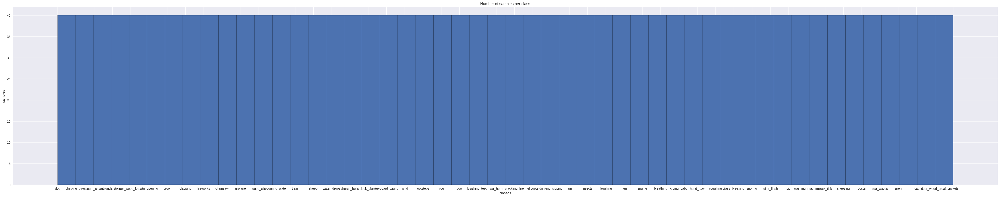

In [9]:
plt.figure(figsize=(55, 10))
plt.title("Number of samples per class")
plt.hist(np.asarray(pure_ds_labels), bins=50, edgecolor='black')
plt.xlabel("classes")
plt.ylabel("samples")
plt.show()

Transient sound:


Continous sound:


Intermittent sound:


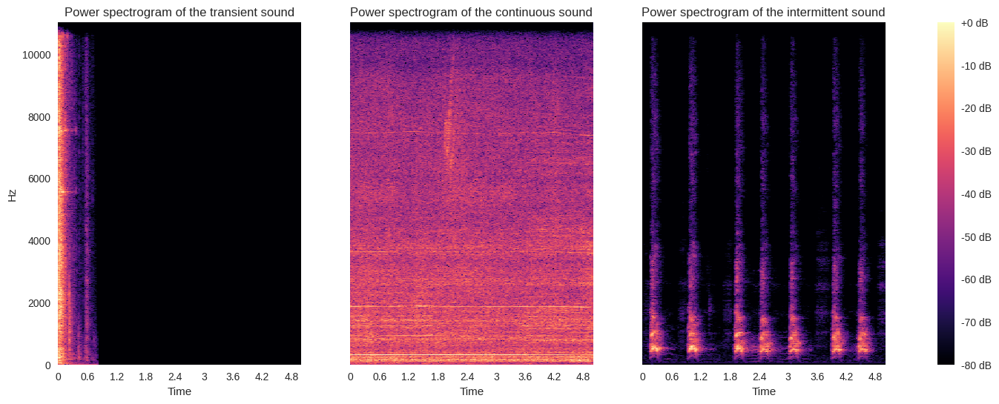

In [10]:
# Setup some filepaths
file0 = path_dataset + '1-84705-A-39.wav'  # Transient
file1 = path_dataset + '1-19872-A-36.wav'  # Continuous
file2 = path_dataset + '1-30344-A-0.wav'   # Intermittent

name = ['transient', 'continuous', 'intermittent']

# Show audio player for each file
print('Transient sound:')
ipd.display(ipd.Audio(data=file0))
print('Continous sound:')
ipd.display(ipd.Audio(data=file1))
print('Intermittent sound:')
ipd.display(ipd.Audio(data=file2))

# Plot stft
files = [file0, file1, file2]
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))
for i in range(3):
  y, sr = librosa.load(files[i])
  D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
  img = librosa.display.specshow(D, y_axis='linear', x_axis='time', sr=sr, ax=ax[i])
  ax[i].set(title='Power spectrogram of the ' + name[i] + ' sound')
  ax[i].label_outer()
fig.colorbar(img, ax=ax, format="%+2.f dB")
plt.show()

Fra quelli simili si fa confusione: se vuelve loco

Washing machine sound:


Helicopter sound:


Engine sound:


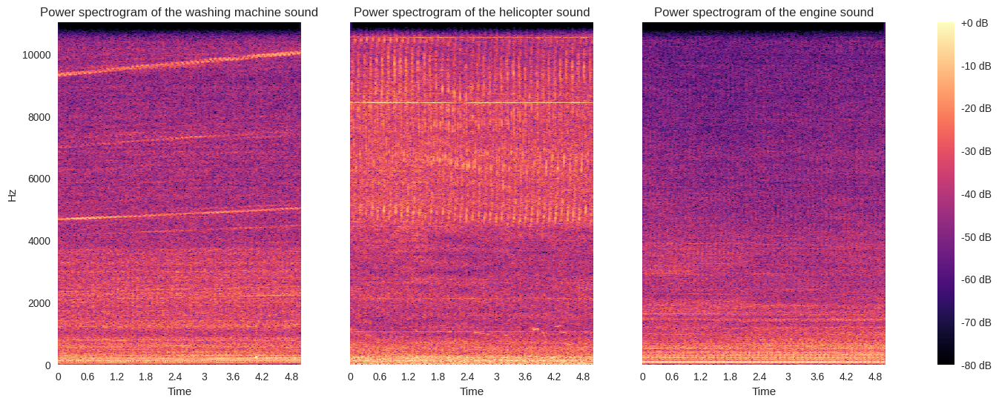

In [11]:
# Setup some filepaths
file0 = path_dataset + '1-23996-B-35.wav'
file1 = path_dataset + '1-172649-A-40.wav'
file2 = path_dataset + '5-232272-A-44.wav'


name = ['washing machine', 'helicopter', 'engine']

# Show audio player for each file
print('Washing machine sound:')
ipd.display(ipd.Audio(data=file0))
print('Helicopter sound:')
ipd.display(ipd.Audio(data=file1))
print('Engine sound:')
ipd.display(ipd.Audio(data=file2))

# Plot stft
files = [file0, file1, file2]
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))
for i in range(3):
  y, sr = librosa.load(files[i])
  D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
  img = librosa.display.specshow(D, y_axis='linear', x_axis='time', sr=sr, ax=ax[i])
  ax[i].set(title='Power spectrogram of the ' + name[i] + ' sound')
  ax[i].label_outer()
fig.colorbar(img, ax=ax, format="%+2.f dB")
plt.show()

Se vogliamo mettere come c'è un'alta variabilità nella stessa classe. Vogliamo l'abbaio

First dog sound:


Second dog sound:


Third dog sound:


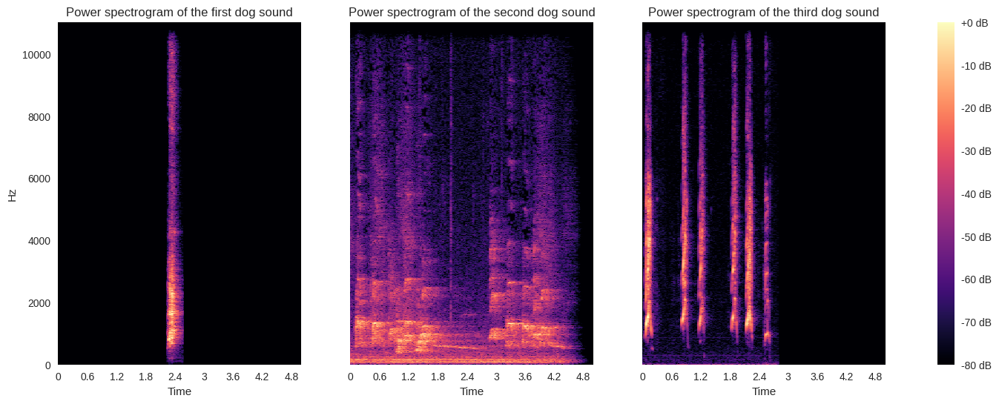

In [12]:
# Setup some filepaths
file0 = path_dataset + '1-100032-A-0.wav'
file1 = path_dataset + '3-136288-A-0.wav'
file2 = path_dataset + '5-9032-A-0.wav'

name = ['first dog', 'second dog', 'third dog']

# Show audio player for each file
print('First dog sound:')
ipd.display(ipd.Audio(data=file0))
print('Second dog sound:')
ipd.display(ipd.Audio(data=file1))
print('Third dog sound:')
ipd.display(ipd.Audio(data=file2))

# Plot stft
files = [file0, file1, file2]
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))
for i in range(3):
  y, sr = librosa.load(files[i])
  D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
  img = librosa.display.specshow(D, y_axis='linear', x_axis='time', sr=sr, ax=ax[i])
  ax[i].set(title='Power spectrogram of the ' + name[i] + ' sound')
  ax[i].label_outer()
fig.colorbar(img, ax=ax, format="%+2.f dB")
plt.show()

Un'altra cosa da far notare è che non esiste una vera conoscenza e struttura di suoni ambientali ('o ritmo, o suono, 'o mare). Harmonic percussion

Harmonic component


Percussive component


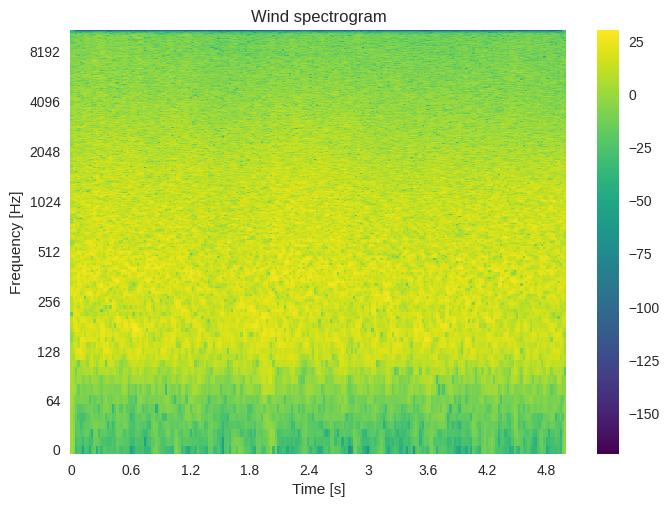

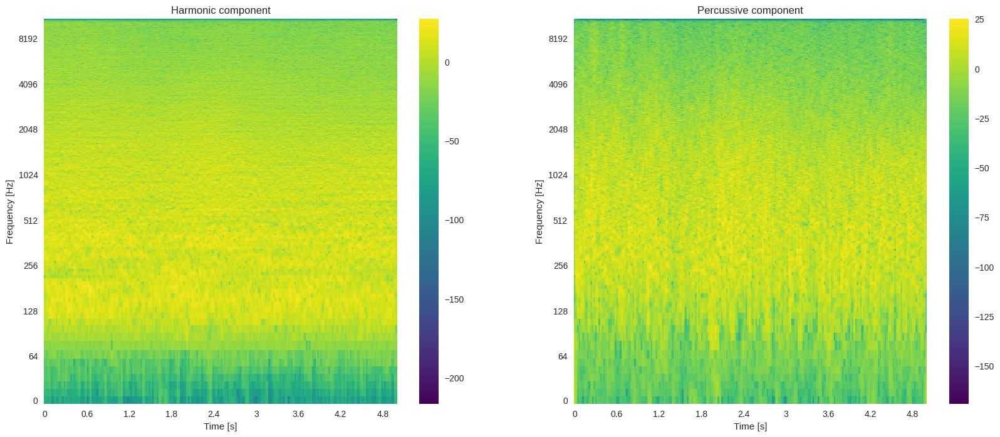

In [13]:
file0 = path_dataset + '1-51037-A-16.wav'

sound, sr = librosa.load(file0)

S = librosa.stft(sound)

librosa.display.specshow(20*np.log10(np.abs(S)+np.finfo(float).eps), sr=sr, x_axis='time', y_axis='log', cmap='viridis')
plt.title(f'Wind spectrogram')
plt.xlabel('Time [s]')
plt.ylabel('Frequency [Hz]')
plt.colorbar()

Hmm, Prs = librosa.decompose.hpss(S)

plt.figure(figsize=(20,8))

plt.subplot(1, 2, 1)
librosa.display.specshow(20*np.log10(np.abs(Hmm)+np.finfo(float).eps), sr=sr, x_axis='time', y_axis='log', cmap='viridis')
plt.title(f'Harmonic component')
plt.xlabel('Time [s]')
plt.ylabel('Frequency [Hz]')
plt.colorbar()

plt.subplot(1, 2, 2)
librosa.display.specshow(20*np.log10(np.abs(Prs)+np.finfo(float).eps), sr=sr, x_axis='time', y_axis='log', cmap='viridis')
plt.title(f'Percussive component')
plt.xlabel('Time [s]')
plt.ylabel('Frequency [Hz]')
plt.colorbar()

print(f'Harmonic component')
ipd.display(ipd.Audio(librosa.istft(Hmm), rate=sr))
print(f'Percussive component')
ipd.display(ipd.Audio(librosa.istft(Prs), rate=sr))

## Pre-processing

Required [MIT Acoustical Reverberation Scene Statistics Survey](https://mcdermottlab.mit.edu/Reverb/IRMAudio/Audio.zip)

We decided to use audiomentations instead of the PyTorch one in order to have compressors.
-	Add different background noises with different SNRs
-	Pitch shifting
-	Time stretching
-	Dynamic range compression
-	Convolution with impulse responses

Background noise

In [14]:
def addGaussianNoise(signal, sr, min_snr_db, max_snr_db, activation_prob):
    """
    Adds Gaussian noise to the audio signal with a specified SNR range and activation probability.
    Args:
        signal (np.ndarray): The audio signal to augment.
        sr (int): Sample rate of the audio signal.
        min_snr_db (float): Minimum SNR in dB.
        max_snr_db (float): Maximum SNR in dB.
        activation_prob (float): Probability of applying the augmentation.
    Returns:
        np.ndarray: The augmented audio signal with Gaussian noise added.
    """

    transform = AddGaussianSNR(
        min_snr_db=min_snr_db,
        max_snr_db=max_snr_db,
        p=activation_prob
    )
    augmented_signal = transform(samples=signal, sample_rate=sr)
    return augmented_signal

Pitch Shifting

In [15]:
def pitchShifter(signal, sr, min_semitones, max_semitones, activation_prob):
    """
    Shifts the pitch of the audio signal by a random number of semitones within a specified range.
    Args:
        signal (np.ndarray): The audio signal to augment.
        sr (int): Sample rate of the audio signal.
        min_semitones (int): Minimum number of semitones to shift.
        max_semitones (int): Maximum number of semitones to shift.
        activation_prob (float): Probability of applying the augmentation.
    Returns:
        np.ndarray: The augmented audio signal with pitch shifted.
    """

    transform = PitchShift(
        min_semitones=min_semitones,
        max_semitones=max_semitones,
        p=activation_prob
    )
    augmented_signal = transform(samples=signal, sample_rate=sr)
    return augmented_signal

Time Stretching

In [16]:
def timeStretcher(signal, sr, min_rate, max_rate, activation_prob, leave_length_unchanged=True):
    """
    Stretches or compresses the audio signal in time by a random factor within a specified range.
    Args:
        signal (np.ndarray): The audio signal to augment.
        sr (int): Sample rate of the audio signal.
        min_rate (float): Minimum stretch/compression rate.
        max_rate (float): Maximum stretch/compression rate.
        activation_prob (float): Probability of applying the augmentation.
        leave_length_unchanged (bool): If True, the length of the output signal will be the same as the input.
    Returns:
        np.ndarray: The augmented audio signal with time-stretching applied.
    """

    transform = TimeStretch(
        min_rate=min_rate,
        max_rate=max_rate,
        leave_length_unchanged=leave_length_unchanged,
        p=activation_prob
    )

    augmented_sound = transform(signal, sample_rate=sr)
    return augmented_sound

Compressor

In [17]:
def compressor(signal, sr, threshold_db, ratio, attack_ms, release_ms):
    """
    Applies a compressor to the audio signal.
    Args:
        signal (np.ndarray): The audio signal to compress.
        sr (int): Sample rate of the audio signal.
        threshold_db (float): Threshold in dB for the compressor.
        ratio (float): Compression ratio.
        attack_ms (int): Attack time in milliseconds.
        release_ms (int): Release time in milliseconds.
    Returns:
        np.ndarray: The compressed audio signal.
    """

    original_dtype = signal.dtype

    if signal.ndim == 1:
        signal = np.expand_dims(signal, axis=1)  # from [samples] to [samples, 1]

    signal = signal.T  # from [samples, channels] to [channels, samples]

    board = Pedalboard([
        Compressor(threshold_db=threshold_db, ratio=ratio, attack_ms=attack_ms, release_ms=release_ms),
    ])

    processed = board(signal, sr)  # output shape: [channels, samples]

    # Back to [samples, channels]
    augmented_sound = processed.T

    # Convert to the original dtype
    if augmented_sound.dtype != original_dtype:
        if np.issubdtype(original_dtype, np.integer):
            max_val = np.max(np.abs(augmented_sound))
            if max_val > 0:
                normalized = augmented_sound / max_val
            else:
                normalized = augmented_sound
            info = np.iinfo(original_dtype)
            scaled = (normalized * info.max).clip(info.min, info.max).astype(original_dtype)
            augmented_sound = scaled
        else:
            augmented_sound = augmented_sound.astype(original_dtype)

    augmented_sound = np.squeeze(augmented_sound)  # Remove any singleton dimensions

    return augmented_sound

Impulse respones convolution

In [18]:
def convolver(signal, sr, activation_prob):
    """
    Applies an impulse response to the audio signal to simulate reverberation.
    Args:
        signal (np.ndarray): The audio signal to convolve.
        sr (int): Sample rate of the audio signal.
        activation_prob (float): Probability of applying the convolution.
    Returns:
        np.ndarray: The augmented audio signal with convolution applied.
    """

    transform = ApplyImpulseResponse(ir_path="Audio", p=activation_prob)

    augmented_sound = transform(signal, sample_rate=sr)

    return augmented_sound

Pre-processing for a single track

In [19]:
def preProcessingSignal(
    signal, sr,
    label,
    gaussianParameters=None,
    pitchParameters=None,
    timeStretchParameters=None,
    compressorParameters=None,
    convolverParameters=None,
    debug=False
    ):
    """
    Preprocesses the audio signal by applying various augmentations based on the provided parameters.
    Args:
        signal (np.ndarray): The audio signal to preprocess.
        sr (int): Sample rate of the audio signal.
        label (str): Label for the audio signal.
        gaussianParameters (tuple, optional): Parameters for Gaussian noise augmentation (min_snr_db, max_snr_db, activation_prob).
        pitchParameters (tuple, optional): Parameters for pitch shifting (min_semitones, max_semitones, activation_prob).
        timeStretchParameters (tuple, optional): Parameters for time stretching (min_rate, max_rate, activation_prob, leave_length_unchanged).
        compressorParameters (tuple, optional): Parameters for compression (threshold_db, ratio, attack_ms, release_ms).
        convolverParameters (float, optional): Probability of applying convolution with impulse response.
        debug (boolean, optional): if debug=True prints debug messages.
    Returns:
        tuple: A tuple containing a list of processed signals and their corresponding labels.
    """

    signals = []
    labels = []

    signals.append(signal)
    labels.append(label)


    if gaussianParameters is not None:
        min_snr_db, max_snr_db, activation_prob = gaussianParameters
        signal_1 = addGaussianNoise(signal, sr, min_snr_db, max_snr_db, activation_prob)
        if debug:
          print(f"Added Gaussian noise with SNR range: {min_snr_db} to {max_snr_db} dB, activation probability: {activation_prob}")
        signals.append(signal_1)
        labels.append(label)

    if pitchParameters is not None:
        min_semitones, max_semitones, activation_prob = pitchParameters
        signal_2 = pitchShifter(signal, sr, min_semitones, max_semitones, activation_prob)
        if debug:
          print(f"Pitch shifted by {min_semitones} to {max_semitones} semitones, activation probability: {activation_prob}")
        signals.append(signal_2)
        labels.append(label)

    if timeStretchParameters is not None:
        min_rate, max_rate, activation_prob, leave_length_unchanged = timeStretchParameters
        signal_3 = timeStretcher(signal, sr, min_rate, max_rate, activation_prob, leave_length_unchanged)
        if debug:
          print(f"Time stretched/compressed by a factor of {min_rate} to {max_rate}, activation probability: {activation_prob}, leave length unchanged: {leave_length_unchanged}")
        signals.append(signal_3)
        labels.append(label)

    if compressorParameters is not None:
        threshold_db, ratio, attack_ms, release_ms = compressorParameters
        signal_4 = compressor(signal, sr, threshold_db, ratio, attack_ms, release_ms)
        if debug:
          print(f"Applied compressor with threshold: {threshold_db} dB, ratio: {ratio}, attack: {attack_ms} ms, release: {release_ms} ms")
        signals.append(signal_4)
        labels.append(label)

    if convolverParameters is not None:
        activation_prob = convolverParameters
        signal_5 = convolver(signal, sr, activation_prob)
        if debug:
          print(f"Applied convolution with impulse response, activation probability: {activation_prob}")
        signals.append(signal_5)
        labels.append(label)

    return signals, labels



Pre-processing for the entire dataset

In [20]:
def preProcessingDataset(
    Xdata, sr,
    Ydata,
    gaussianParameters=None,
    pitchParameters=None,
    timeStretchParameters=None,
    compressorParameters=None,
    convolverParameters=None,
    debug=False
):
    """
    Preprocesses a dataset of audio signals by applying various augmentations based on the provided parameters.
    Args:
        Xdata (list): List of audio signals to preprocess.
        sr (int): Sample rate of the audio signals.
        Ydata (list): List of labels corresponding to the audio signals.
        gaussianParameters (tuple, optional): Parameters for Gaussian noise augmentation (min_snr_db, max_snr_db, activation_prob).
        pitchParameters (tuple, optional): Parameters for pitch shifting (min_semitones, max_semitones, activation_prob).
        timeStretchParameters (tuple, optional): Parameters for time stretching (min_rate, max_rate, activation_prob, leave_length_unchanged).
        compressorParameters (tuple, optional): Parameters for compression (threshold_db, ratio, attack_ms, release_ms).
        convolverParameters (float, optional): Probability of applying convolution with impulse response.
        debug (boolean, optional): if debug=True prints debug messages.
    Returns:
        tuple: A tuple containing a numpy array of processed signals and a numpy array of their corresponding labels.
    """

    all_signals = []
    all_labels = []

    for signal, label in zip(Xdata, Ydata):
        signals, labels = preProcessingSignal(
            signal, sr, label,
            gaussianParameters,
            pitchParameters,
            timeStretchParameters,
            compressorParameters,
            convolverParameters,
            debug
        )
        all_signals.extend(signals)
        all_labels.extend(labels)

    all_signals = np.asarray(all_signals)
    all_labels = np.asarray(all_labels)

    return all_signals, all_labels

## Load signals

Nos cargamos todos los signales

In [21]:
pure_signals = []

for file in pure_ds_files:
    filepath = os.path.join(path_dataset, file)
    pure_signal, sr = librosa.load(filepath, sr=44100)
    pure_signals.append(pure_signal)

Check pre pre-processing

In [22]:
print(f"Number of audio files: {len(pure_signals)}")
print(f"Number of audio labels: {len(pure_ds_labels)}")

Number of audio files: 2000
Number of audio labels: 2000


Lista -> np

In [23]:
pure_signals_array = np.asarray(pure_signals)

# Transform the labels to numbers
label_mapping = {label: idx for idx, label in enumerate(dict.fromkeys(pure_ds_labels))}
numerical_labels = np.array([label_mapping[label] for label in pure_ds_labels])

Ydata = np.asarray(numerical_labels)

print('Pure signals length: {} \nYata shape: {}'.format(pure_signals_array.shape, Ydata.shape))

Pure signals length: (2000, 220500) 
Yata shape: (2000,)


## **Data Augmentation**

Dataset splitting with cross-validation, inspired by [Heittola, 2017](https://inria.hal.science/hal-01627981/)

Stratified K-Fold Cross Validation: ensures that each fold maintains the same class distribution as the original dataset

In [24]:
signal_example = pure_signals_array[0]
label_example = Ydata[0]

signal_example_aug, label_example_aug = preProcessingSignal(
    signal=signal_example,
    sr=sr,
    label=label_example,
    gaussianParameters = (5, 40, 1),
    pitchParameters = (-5, 5, 1),
    timeStretchParameters = (0.8, 1.25, 1, True),
    compressorParameters = (-20, 4.0, 10.0, 100.0),
    convolverParameters = 1
)

type_of_processing = [
    "Original",
    "Gaussian Noise",
    "Pitch Shift",
    "Time Stretch",
    "Compressor",
    "Convolver"
]

# Listen to the first 5 augmented audio files
for i in range(6):
    print(type_of_processing[i])
    ipd.display(ipd.Audio(data=signal_example_aug[i], rate=sr))

Original


Gaussian Noise


Pitch Shift


Time Stretch


Compressor


Convolver


In [25]:
seed = 1234

train_size = 0.7
val_size = 0.2
test_size = 0.1

X_trainval, X_test, y_trainval, y_test = train_test_split(pure_signals_array, Ydata, test_size=test_size, stratify=Ydata, random_state=seed)

# Shapes for each partition
print('X_trainval shape: {} \nX_test shape: {} \ny_trainval shape: {} \ny_test shape: {} \n'.format(X_trainval.shape, X_test.shape, y_trainval.shape, y_test.shape))


X_trainval shape: (1800, 220500) 
X_test shape: (200, 220500) 
y_trainval shape: (1800,) 
y_test shape: (200,) 



## **Feature Extraction**

In [26]:
def calculate_melsp(x, n_fft=1024, hop_length=128):
    stft = np.abs(librosa.stft(x, n_fft=n_fft, hop_length=hop_length))**2
    log_stft = librosa.power_to_db(stft)
    melsp = librosa.feature.melspectrogram(S=log_stft,n_mels=128)
    return melsp

In [27]:
mel_spegrams_test = []

for signal in X_test:
    mel_spec = calculate_melsp(signal)
    mel_spegrams_test.append(mel_spec)

X_test = np.array(mel_spegrams_test)
X_test_exp = np.expand_dims(X_test, axis=-1)
print('X_test_exp shape: {} \ny_test shape: {}'.format(X_test_exp.shape, y_test.shape))

X_test_exp shape: (200, 128, 1723, 1) 
y_test shape: (200,)


## **Model Definition**

In [28]:
def fund_cell(inputs, filters, kernel_size, strides):
    x = tf.keras.layers.Conv2D(filters, kernel_size=kernel_size, strides=strides, padding='same')(inputs)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation("relu")(x)
    return x

In [29]:
def build_model(input_shape):

  inputs = tf.keras.layers.Input(shape=input_shape)

  # Branch 1
  x_1 = fund_cell(inputs, filters=32, kernel_size=(1,8), strides=(1,2))
  x_1 = fund_cell(x_1, filters=32, kernel_size=(8,1), strides=(2,1))
  x_1 = fund_cell(x_1, filters=64, kernel_size=(1,8), strides=(1,2))
  x_1 = fund_cell(x_1, filters=64, kernel_size=(8,1), strides=(2,1))

  # Branch 2
  x_2 = fund_cell(inputs, filters=32, kernel_size=(1,16), strides=(1,2))
  x_2 = fund_cell(x_2, filters=32, kernel_size=(16,1), strides=(2,1))
  x_2 = fund_cell(x_2, filters=64, kernel_size=(1,16), strides=(1,2))
  x_2 = fund_cell(x_2, filters=64, kernel_size=(16,1), strides=(2,1))

  # Branch 3
  x_3 = fund_cell(inputs, filters=32, kernel_size=(1,32), strides=(1,2))
  x_3 = fund_cell(x_3, filters=32, kernel_size=(32,1), strides=(2,1))
  x_3 = fund_cell(x_3, filters=64, kernel_size=(1,32), strides=(1,2))
  x_3 = fund_cell(x_3, filters=64, kernel_size=(32,1), strides=(2,1))

  # Branch 4
  x_4 = fund_cell(inputs, filters=32, kernel_size=(1,64), strides=(1,2))
  x_4 = fund_cell(x_4, filters=32, kernel_size=(64,1), strides=(2,1))
  x_4 = fund_cell(x_4, filters=64, kernel_size=(1,64), strides=(1,2))
  x_4 = fund_cell(x_4, filters=64, kernel_size=(64,1), strides=(2,1))

  # Branches merging
  x = tf.keras.layers.Add()([x_1, x_2, x_3, x_4])

  # Final layers
  x = fund_cell(x, filters=128, kernel_size=(1,16), strides=(1,2))
  x = fund_cell(x, filters=128, kernel_size=(16,1), strides=(2,1))

  x = tf.keras.layers.GlobalAveragePooling2D()(x)
  # Output layer
  x = tf.keras.layers.Dense(50)(x)
  x = tf.keras.layers.Activation("softmax")(x)

  model = tf.keras.models.Model(inputs, x)

  # initiate Adam optimizer
  opt = tf.keras.optimizers.Adam(learning_rate=0.00005, amsgrad=True)

  # Let's train the model using Adam with amsgrad
  model.compile(loss='sparse_categorical_crossentropy',
                optimizer=opt,
                metrics=['accuracy'])

  return model

## **Model training**

In [30]:
# Stratified K-Fold Cross Validation
n_splits = 5
batch_size = 64

skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=seed)

fold_no = 0
X_val_list = []
y_val_list = []

# Loop through each fold for training and evaluation
for train_idx, val_idx in skf.split(X_trainval, y_trainval):
    # Split the data into train and validation sets for this fold
    X_train_fold, X_val_fold = X_trainval[train_idx], X_trainval[val_idx]
    y_train_fold, y_val_fold = y_trainval[train_idx], y_trainval[val_idx]

    # Print the shape of each partition
    print(f"Fold {fold_no}:")
    print(f"  Train data shape: {X_train_fold.shape}")
    print(f"  Validation data shape: {X_val_fold.shape}")


    # DATA AUGMENTATION + PRE-PROCESSING
    #----------------------------------------------------------------------------------------------------------------------

    # Data augmentation on the training fold
    X_train_fold_aug, y_train_fold_aug = preProcessingDataset(
        Xdata=X_train_fold,
        sr=sr,
        Ydata=y_train_fold,
        gaussianParameters = (5, 40, 1),
        pitchParameters = (-5, 5, 1),
        timeStretchParameters = (0.8, 1.25, 1, True),
        compressorParameters = (-20, 4.0, 10.0, 100.0),
        convolverParameters = 1
    )

    # mel specs train
    mel_spegrams_train = []
    for signal in X_train_fold_aug:
        mel_spec = calculate_melsp(signal)
        mel_spegrams_train.append(mel_spec)

    X_train = np.array(mel_spegrams_train)
    X_train_exp = np.expand_dims(X_train, axis=-1)

    # Print the shape after augmentation
    print(f"Augmented Train data shape: {X_train_exp.shape}")

    # mel specs val
    mel_spegrams_val = []
    for signal in X_val_fold:
        mel_spec = calculate_melsp(signal)
        mel_spegrams_val.append(mel_spec)

    X_val = np.array(mel_spegrams_val)
    X_val_exp = np.expand_dims(X_val, axis=-1)
    X_val_list.append(X_val_exp)
    y_val_list.append(y_val_fold)

    # Print the shape after augmentation
    print(f"Val data shape: {X_val_exp.shape}")

    # MODEL AND CALLBACKS
    #----------------------------------------------------------------------------------------------------------------------

    # Build and train the CRNN model
    model = build_model(input_shape=X_train_exp.shape[1:])

    # Model checkpoint callback (per-fold)
    model_name = f'model_fold_{fold_no}.h5'
    model_checkpoint = ModelCheckpoint(model_name, monitor='val_accuracy', save_best_only=True, verbose=1)

    # CSVLogger
    csv_logger = CSVLogger(f'model_fold_{fold_no}.log', append=False)

    # EarlyStopping
    early_stopping = EarlyStopping(monitor='val_loss', patience=10)

    # Store all these callbacks in a list, Callback list
    callbacks = [csv_logger, early_stopping, model_checkpoint]

    # Train the model for the current fold
    history = model.fit(X_train_exp, y_train_fold_aug, epochs=300, batch_size=batch_size, validation_data=(X_val_exp, y_val_fold), callbacks=callbacks)

    fold_no += 1

Fold 0:
  Train data shape: (1440, 220500)
  Validation data shape: (360, 220500)
Augmented Train data shape: (8640, 128, 1723, 1)
Val data shape: (360, 128, 1723, 1)
Epoch 1/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - accuracy: 0.0720 - loss: 3.7286
Epoch 1: val_accuracy improved from -inf to 0.02222, saving model to model_fold_0.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 151s 371ms/step - accuracy: 0.0723 - loss: 3.7271 - val_accuracy: 0.0222 - val_loss: 3.9736
Epoch 2/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - accuracy: 0.2185 - loss: 3.0836
Epoch 2: val_accuracy improved from 0.02222 to 0.06944, saving model to model_fold_0.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.2188 - loss: 3.0830 - val_accuracy: 0.0694 - val_loss: 3.8435
Epoch 3/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.3430 - loss: 2.7224
Epoch 3: val_accuracy improved from 0.06944 to 0.11944, saving model to model_fold_0.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.3431 - loss: 2.7220 - val_accuracy: 0.1194 - val_loss: 3.6253
Epoch 4/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - accuracy: 0.4259 - loss: 2.4939
Epoch 4: val_accuracy improved from 0.11944 to 0.26111, saving model to model_fold_0.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.4260 - loss: 2.4935 - val_accuracy: 0.2611 - val_loss: 2.9007
Epoch 5/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.4855 - loss: 2.2981
Epoch 5: val_accuracy improved from 0.26111 to 0.46944, saving model to model_fold_0.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.4856 - loss: 2.2977 - val_accuracy: 0.4694 - val_loss: 2.2152
Epoch 6/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - accuracy: 0.5439 - loss: 2.1131
Epoch 6: val_accuracy improved from 0.46944 to 0.47778, saving model to model_fold_0.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.5440 - loss: 2.1129 - val_accuracy: 0.4778 - val_loss: 2.1293
Epoch 7/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.5885 - loss: 1.9602
Epoch 7: val_accuracy improved from 0.47778 to 0.55833, saving model to model_fold_0.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.5885 - loss: 1.9601 - val_accuracy: 0.5583 - val_loss: 1.9855
Epoch 8/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.6234 - loss: 1.8355
Epoch 8: val_accuracy improved from 0.55833 to 0.61389, saving model to model_fold_0.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.6234 - loss: 1.8354 - val_accuracy: 0.6139 - val_loss: 1.7897
Epoch 9/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.6350 - loss: 1.7470
Epoch 9: val_accuracy improved from 0.61389 to 0.64167, saving model to model_fold_0.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.6351 - loss: 1.7468 - val_accuracy: 0.6417 - val_loss: 1.6347
Epoch 10/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - accuracy: 0.6714 - loss: 1.6299
Epoch 10: val_accuracy did not improve from 0.64167
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 278ms/step - accuracy: 0.6714 - loss: 1.6298 - val_accuracy: 0.6361 - val_loss: 1.6889
Epoch 11/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.7058 - loss: 1.5226
Epoch 11: val_accuracy improved from 0.64167 to 0.69167, saving model to model_fold_0.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.7058 - loss: 1.5225 - val_accuracy: 0.6917 - val_loss: 1.5046
Epoch 12/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.7107 - loss: 1.4714
Epoch 12: val_accuracy did not improve from 0.69167
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.7108 - loss: 1.4712 - val_accuracy: 0.6833 - val_loss: 1.5091
Epoch 13/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.7305 - loss: 1.3794
Epoch 13: val_accuracy did not improve from 0.69167
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.7305 - loss: 1.3792 - val_accuracy: 0.6861 - val_loss: 1.4155
Epoch 14/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.7469 - loss: 1.3193
Epoch 14: val_accuracy did not improve from 0.69167
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.7469 - loss: 1.3191 - val_accuracy: 0.6667 - val_loss: 1.4127
Epoch 15/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.7676 - loss: 1.2546
Epoc

135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.7880 - loss: 1.1782 - val_accuracy: 0.7194 - val_loss: 1.3429
Epoch 17/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - accuracy: 0.7933 - loss: 1.1261
Epoch 17: val_accuracy did not improve from 0.71944
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 278ms/step - accuracy: 0.7933 - loss: 1.1260 - val_accuracy: 0.7000 - val_loss: 1.2277
Epoch 18/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.8004 - loss: 1.0770
Epoch 18: val_accuracy did not improve from 0.71944
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 278ms/step - accuracy: 0.8005 - loss: 1.0769 - val_accuracy: 0.7111 - val_loss: 1.1773
Epoch 19/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - accuracy: 0.8243 - loss: 1.0079
Epoch 19: val_accuracy improved from 0.71944 to 0.78333, saving model to model_fold_0.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.8242 - loss: 1.0080 - val_accuracy: 0.7833 - val_loss: 1.0935
Epoch 20/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.8282 - loss: 0.9674
Epoch 20: val_accuracy did not improve from 0.78333
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.8282 - loss: 0.9675 - val_accuracy: 0.7111 - val_loss: 1.1488
Epoch 21/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.8303 - loss: 0.9368
Epoch 21: val_accuracy did not improve from 0.78333
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 278ms/step - accuracy: 0.8303 - loss: 0.9367 - val_accuracy: 0.7250 - val_loss: 1.2021
Epoch 22/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - accuracy: 0.8499 - loss: 0.8912
Epoch 22: val_accuracy did not improve from 0.78333
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 278ms/step - accuracy: 0.8499 - loss: 0.8911 - val_accuracy: 0.7833 - val_loss: 1.0388
Epoch 23/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.8613 - loss: 0.8591
Epoc

135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.8612 - loss: 0.8590 - val_accuracy: 0.7861 - val_loss: 1.0115
Epoch 24/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.8612 - loss: 0.8361
Epoch 24: val_accuracy did not improve from 0.78611
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.8612 - loss: 0.8360 - val_accuracy: 0.7750 - val_loss: 0.9619
Epoch 25/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.8708 - loss: 0.7926
Epoch 25: val_accuracy did not improve from 0.78611
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.8708 - loss: 0.7925 - val_accuracy: 0.7306 - val_loss: 1.0635
Epoch 26/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.8770 - loss: 0.7676
Epoch 26: val_accuracy did not improve from 0.78611
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.8770 - loss: 0.7675 - val_accuracy: 0.7806 - val_loss: 0.9787
Epoch 27/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - accuracy: 0.8834 - loss: 0.7243
Epoc

135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.8833 - loss: 0.7243 - val_accuracy: 0.7972 - val_loss: 0.9279
Epoch 28/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.8921 - loss: 0.6923
Epoch 28: val_accuracy did not improve from 0.79722
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 278ms/step - accuracy: 0.8921 - loss: 0.6922 - val_accuracy: 0.7306 - val_loss: 1.0729
Epoch 29/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.8938 - loss: 0.6720
Epoch 29: val_accuracy did not improve from 0.79722
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.8939 - loss: 0.6720 - val_accuracy: 0.7667 - val_loss: 0.9350
Epoch 30/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.8985 - loss: 0.6387
Epoch 30: val_accuracy improved from 0.79722 to 0.80556, saving model to model_fold_0.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.8986 - loss: 0.6387 - val_accuracy: 0.8056 - val_loss: 0.8831
Epoch 31/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9094 - loss: 0.6023
Epoch 31: val_accuracy did not improve from 0.80556
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9094 - loss: 0.6023 - val_accuracy: 0.7861 - val_loss: 0.8867
Epoch 32/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9099 - loss: 0.5960
Epoch 32: val_accuracy did not improve from 0.80556
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 278ms/step - accuracy: 0.9099 - loss: 0.5959 - val_accuracy: 0.7750 - val_loss: 0.8823
Epoch 33/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9159 - loss: 0.5637
Epoch 33: val_accuracy improved from 0.80556 to 0.81389, saving model to model_fold_0.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.9159 - loss: 0.5637 - val_accuracy: 0.8139 - val_loss: 0.8243
Epoch 34/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - accuracy: 0.9235 - loss: 0.5459
Epoch 34: val_accuracy improved from 0.81389 to 0.82222, saving model to model_fold_0.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.9235 - loss: 0.5458 - val_accuracy: 0.8222 - val_loss: 0.8045
Epoch 35/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - accuracy: 0.9158 - loss: 0.5439
Epoch 35: val_accuracy did not improve from 0.82222
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 278ms/step - accuracy: 0.9158 - loss: 0.5439 - val_accuracy: 0.8167 - val_loss: 0.7838
Epoch 36/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9251 - loss: 0.5175
Epoch 36: val_accuracy did not improve from 0.82222
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 278ms/step - accuracy: 0.9251 - loss: 0.5174 - val_accuracy: 0.7917 - val_loss: 0.8153
Epoch 37/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - accuracy: 0.9288 - loss: 0.4928
Epoch 37: val_accuracy improved from 0.82222 to 0.82778, saving model to model_fold_0.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.9289 - loss: 0.4927 - val_accuracy: 0.8278 - val_loss: 0.7623
Epoch 38/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9375 - loss: 0.4728
Epoch 38: val_accuracy did not improve from 0.82778
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9375 - loss: 0.4728 - val_accuracy: 0.7750 - val_loss: 0.8719
Epoch 39/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - accuracy: 0.9384 - loss: 0.4495
Epoch 39: val_accuracy did not improve from 0.82778
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 278ms/step - accuracy: 0.9384 - loss: 0.4496 - val_accuracy: 0.8056 - val_loss: 0.7541
Epoch 40/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - accuracy: 0.9397 - loss: 0.4384
Epoch 40: val_accuracy did not improve from 0.82778
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 278ms/step - accuracy: 0.9398 - loss: 0.4384 - val_accuracy: 0.8222 - val_loss: 0.7775
Epoch 41/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - accuracy: 0.9413 - loss: 0.4324
Epoc

135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.9680 - loss: 0.2871 - val_accuracy: 0.8306 - val_loss: 0.6849
Epoch 54/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - accuracy: 0.9720 - loss: 0.2715
Epoch 54: val_accuracy did not improve from 0.83056
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 278ms/step - accuracy: 0.9720 - loss: 0.2715 - val_accuracy: 0.8306 - val_loss: 0.7046
Epoch 55/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - accuracy: 0.9691 - loss: 0.2710
Epoch 55: val_accuracy improved from 0.83056 to 0.85000, saving model to model_fold_0.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.9691 - loss: 0.2710 - val_accuracy: 0.8500 - val_loss: 0.6765
Epoch 56/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9691 - loss: 0.2698
Epoch 56: val_accuracy did not improve from 0.85000
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9691 - loss: 0.2698 - val_accuracy: 0.8056 - val_loss: 0.7599
Epoch 57/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9769 - loss: 0.2503
Epoch 57: val_accuracy did not improve from 0.85000
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9769 - loss: 0.2504 - val_accuracy: 0.8167 - val_loss: 0.6583
Epoch 58/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9816 - loss: 0.2439
Epoch 58: val_accuracy did not improve from 0.85000
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 278ms/step - accuracy: 0.9816 - loss: 0.2439 - val_accuracy: 0.8222 - val_loss: 0.6809
Epoch 59/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9769 - loss: 0.2367
Epoc

135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.9810 - loss: 0.2139 - val_accuracy: 0.8528 - val_loss: 0.6202
Epoch 64/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9778 - loss: 0.2107
Epoch 64: val_accuracy did not improve from 0.85278
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9779 - loss: 0.2107 - val_accuracy: 0.8278 - val_loss: 0.6836
Epoch 65/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9827 - loss: 0.2013
Epoch 65: val_accuracy did not improve from 0.85278
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9827 - loss: 0.2013 - val_accuracy: 0.8250 - val_loss: 0.6139
Epoch 66/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9802 - loss: 0.1997
Epoch 66: val_accuracy did not improve from 0.85278
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9802 - loss: 0.1997 - val_accuracy: 0.8389 - val_loss: 0.6638
Epoch 67/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9848 - loss: 0.1873
Epoc

135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.9829 - loss: 0.1917 - val_accuracy: 0.8611 - val_loss: 0.6228
Epoch 69/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9860 - loss: 0.1726
Epoch 69: val_accuracy did not improve from 0.86111
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9860 - loss: 0.1727 - val_accuracy: 0.8500 - val_loss: 0.6150
Epoch 70/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9856 - loss: 0.1862
Epoch 70: val_accuracy did not improve from 0.86111
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9856 - loss: 0.1861 - val_accuracy: 0.8361 - val_loss: 0.6638
Epoch 71/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9865 - loss: 0.1684
Epoch 71: val_accuracy did not improve from 0.86111
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 278ms/step - accuracy: 0.9865 - loss: 0.1685 - val_accuracy: 0.8139 - val_loss: 0.7071
Epoch 72/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9866 - loss: 0.1723
Epoc

135/135 ━━━━━━━━━━━━━━━━━━━━ 62s 304ms/step - accuracy: 0.0676 - loss: 3.6842 - val_accuracy: 0.0250 - val_loss: 3.9422
Epoch 2/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.2235 - loss: 3.0605
Epoch 2: val_accuracy improved from 0.02500 to 0.10556, saving model to model_fold_1.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.2238 - loss: 3.0598 - val_accuracy: 0.1056 - val_loss: 3.5879
Epoch 3/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.3558 - loss: 2.6842
Epoch 3: val_accuracy improved from 0.10556 to 0.16944, saving model to model_fold_1.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.3559 - loss: 2.6838 - val_accuracy: 0.1694 - val_loss: 3.1296
Epoch 4/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.4402 - loss: 2.4400
Epoch 4: val_accuracy improved from 0.16944 to 0.29167, saving model to model_fold_1.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.4402 - loss: 2.4397 - val_accuracy: 0.2917 - val_loss: 2.7520
Epoch 5/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.4833 - loss: 2.2852
Epoch 5: val_accuracy improved from 0.29167 to 0.50000, saving model to model_fold_1.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.4834 - loss: 2.2847 - val_accuracy: 0.5000 - val_loss: 2.2677
Epoch 6/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.5363 - loss: 2.0840
Epoch 6: val_accuracy did not improve from 0.50000
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.5363 - loss: 2.0839 - val_accuracy: 0.5000 - val_loss: 2.1054
Epoch 7/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.5809 - loss: 1.9674
Epoch 7: val_accuracy did not improve from 0.50000
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.5809 - loss: 1.9672 - val_accuracy: 0.5000 - val_loss: 1.9558
Epoch 8/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.6113 - loss: 1.8271
Epoch 8: val_accuracy improved from 0.50000 to 0.54444, saving model to model_fold_1.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.6113 - loss: 1.8270 - val_accuracy: 0.5444 - val_loss: 1.8620
Epoch 9/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.6245 - loss: 1.7436
Epoch 9: val_accuracy improved from 0.54444 to 0.55000, saving model to model_fold_1.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.6246 - loss: 1.7434 - val_accuracy: 0.5500 - val_loss: 1.7957
Epoch 10/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.6583 - loss: 1.6293
Epoch 10: val_accuracy improved from 0.55000 to 0.58611, saving model to model_fold_1.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.6584 - loss: 1.6292 - val_accuracy: 0.5861 - val_loss: 1.7280
Epoch 11/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.6966 - loss: 1.5305
Epoch 11: val_accuracy improved from 0.58611 to 0.62222, saving model to model_fold_1.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.6966 - loss: 1.5306 - val_accuracy: 0.6222 - val_loss: 1.6224
Epoch 12/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.7020 - loss: 1.4722
Epoch 12: val_accuracy improved from 0.62222 to 0.66667, saving model to model_fold_1.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.7020 - loss: 1.4720 - val_accuracy: 0.6667 - val_loss: 1.5331
Epoch 13/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.7306 - loss: 1.3775
Epoch 13: val_accuracy did not improve from 0.66667
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.7306 - loss: 1.3776 - val_accuracy: 0.6500 - val_loss: 1.5108
Epoch 14/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.7382 - loss: 1.3225
Epoch 14: val_accuracy improved from 0.66667 to 0.68889, saving model to model_fold_1.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.7382 - loss: 1.3225 - val_accuracy: 0.6889 - val_loss: 1.3864
Epoch 15/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.7572 - loss: 1.2484
Epoch 15: val_accuracy did not improve from 0.68889
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.7572 - loss: 1.2484 - val_accuracy: 0.6833 - val_loss: 1.3981
Epoch 16/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.7715 - loss: 1.2021
Epoch 16: val_accuracy did not improve from 0.68889
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.7715 - loss: 1.2021 - val_accuracy: 0.6806 - val_loss: 1.3472
Epoch 17/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.7855 - loss: 1.1516
Epoch 17: val_accuracy improved from 0.68889 to 0.70000, saving model to model_fold_1.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.7855 - loss: 1.1515 - val_accuracy: 0.7000 - val_loss: 1.2851
Epoch 18/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.8071 - loss: 1.0787
Epoch 18: val_accuracy improved from 0.70000 to 0.70556, saving model to model_fold_1.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.8070 - loss: 1.0788 - val_accuracy: 0.7056 - val_loss: 1.2579
Epoch 19/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.8115 - loss: 1.0387
Epoch 19: val_accuracy did not improve from 0.70556
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 278ms/step - accuracy: 0.8114 - loss: 1.0387 - val_accuracy: 0.6833 - val_loss: 1.2538
Epoch 20/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.8112 - loss: 1.0209
Epoch 20: val_accuracy improved from 0.70556 to 0.73611, saving model to model_fold_1.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.8112 - loss: 1.0208 - val_accuracy: 0.7361 - val_loss: 1.1332
Epoch 21/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.8269 - loss: 0.9592
Epoch 21: val_accuracy did not improve from 0.73611
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.8269 - loss: 0.9591 - val_accuracy: 0.7167 - val_loss: 1.1629
Epoch 22/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.8363 - loss: 0.9292
Epoch 22: val_accuracy did not improve from 0.73611
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.8363 - loss: 0.9291 - val_accuracy: 0.7278 - val_loss: 1.1729
Epoch 23/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.8458 - loss: 0.8948
Epoch 23: val_accuracy did not improve from 0.73611
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.8458 - loss: 0.8947 - val_accuracy: 0.7250 - val_loss: 1.1219
Epoch 24/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.8617 - loss: 0.8338
Epoc

135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.8601 - loss: 0.8255 - val_accuracy: 0.7417 - val_loss: 1.0985
Epoch 26/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.8777 - loss: 0.7609
Epoch 26: val_accuracy improved from 0.74167 to 0.74722, saving model to model_fold_1.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.8776 - loss: 0.7609 - val_accuracy: 0.7472 - val_loss: 1.0282
Epoch 27/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.8772 - loss: 0.7486
Epoch 27: val_accuracy did not improve from 0.74722
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.8772 - loss: 0.7486 - val_accuracy: 0.7111 - val_loss: 1.0818
Epoch 28/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.8900 - loss: 0.7130
Epoch 28: val_accuracy did not improve from 0.74722
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.8900 - loss: 0.7131 - val_accuracy: 0.7389 - val_loss: 1.0574
Epoch 29/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.8887 - loss: 0.6970
Epoch 29: val_accuracy did not improve from 0.74722
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.8887 - loss: 0.6969 - val_accuracy: 0.7361 - val_loss: 1.0309
Epoch 30/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.8984 - loss: 0.6699
Epoc

135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.8984 - loss: 0.6699 - val_accuracy: 0.7583 - val_loss: 0.9216
Epoch 31/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.8984 - loss: 0.6323
Epoch 31: val_accuracy did not improve from 0.75833
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.8984 - loss: 0.6324 - val_accuracy: 0.7306 - val_loss: 1.0202
Epoch 32/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9034 - loss: 0.6239
Epoch 32: val_accuracy improved from 0.75833 to 0.76667, saving model to model_fold_1.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.9034 - loss: 0.6239 - val_accuracy: 0.7667 - val_loss: 0.9991
Epoch 33/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9144 - loss: 0.5841
Epoch 33: val_accuracy improved from 0.76667 to 0.76944, saving model to model_fold_1.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.9143 - loss: 0.5841 - val_accuracy: 0.7694 - val_loss: 0.9243
Epoch 34/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9210 - loss: 0.5653
Epoch 34: val_accuracy did not improve from 0.76944
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9210 - loss: 0.5653 - val_accuracy: 0.7472 - val_loss: 0.9307
Epoch 35/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9160 - loss: 0.5459
Epoch 35: val_accuracy did not improve from 0.76944
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9160 - loss: 0.5460 - val_accuracy: 0.7639 - val_loss: 0.8708
Epoch 36/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9191 - loss: 0.5261
Epoch 36: val_accuracy improved from 0.76944 to 0.79722, saving model to model_fold_1.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.9190 - loss: 0.5262 - val_accuracy: 0.7972 - val_loss: 0.8613
Epoch 37/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9278 - loss: 0.5104
Epoch 37: val_accuracy did not improve from 0.79722
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9278 - loss: 0.5104 - val_accuracy: 0.7528 - val_loss: 0.9610
Epoch 38/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9294 - loss: 0.5028
Epoch 38: val_accuracy did not improve from 0.79722
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9294 - loss: 0.5028 - val_accuracy: 0.7750 - val_loss: 0.8745
Epoch 39/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9352 - loss: 0.4810
Epoch 39: val_accuracy did not improve from 0.79722
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9352 - loss: 0.4810 - val_accuracy: 0.7750 - val_loss: 0.8427
Epoch 40/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9291 - loss: 0.4747
Epoc

135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.9478 - loss: 0.4161 - val_accuracy: 0.8000 - val_loss: 0.8408
Epoch 43/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9441 - loss: 0.4210
Epoch 43: val_accuracy did not improve from 0.80000
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9441 - loss: 0.4210 - val_accuracy: 0.8000 - val_loss: 0.7934
Epoch 44/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9414 - loss: 0.4167
Epoch 44: val_accuracy improved from 0.80000 to 0.80833, saving model to model_fold_1.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.9414 - loss: 0.4167 - val_accuracy: 0.8083 - val_loss: 0.7968
Epoch 45/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9472 - loss: 0.3881
Epoch 45: val_accuracy did not improve from 0.80833
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9472 - loss: 0.3881 - val_accuracy: 0.7750 - val_loss: 0.8527
Epoch 46/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9481 - loss: 0.3820
Epoch 46: val_accuracy improved from 0.80833 to 0.81389, saving model to model_fold_1.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.9481 - loss: 0.3820 - val_accuracy: 0.8139 - val_loss: 0.7468
Epoch 47/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9584 - loss: 0.3618
Epoch 47: val_accuracy did not improve from 0.81389
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9583 - loss: 0.3618 - val_accuracy: 0.7833 - val_loss: 0.8188
Epoch 48/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9570 - loss: 0.3537
Epoch 48: val_accuracy did not improve from 0.81389
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9570 - loss: 0.3537 - val_accuracy: 0.8083 - val_loss: 0.7747
Epoch 49/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9562 - loss: 0.3454
Epoch 49: val_accuracy did not improve from 0.81389
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9562 - loss: 0.3454 - val_accuracy: 0.7750 - val_loss: 0.8644
Epoch 50/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9602 - loss: 0.3271
Epoc

135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.9632 - loss: 0.3117 - val_accuracy: 0.8222 - val_loss: 0.7047
Epoch 54/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9670 - loss: 0.2912
Epoch 54: val_accuracy improved from 0.82222 to 0.82500, saving model to model_fold_1.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.9671 - loss: 0.2912 - val_accuracy: 0.8250 - val_loss: 0.7026
Epoch 55/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9697 - loss: 0.2857
Epoch 55: val_accuracy did not improve from 0.82500
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9697 - loss: 0.2857 - val_accuracy: 0.8028 - val_loss: 0.7454
Epoch 56/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9707 - loss: 0.2796
Epoch 56: val_accuracy did not improve from 0.82500
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9707 - loss: 0.2796 - val_accuracy: 0.8194 - val_loss: 0.7001
Epoch 57/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9763 - loss: 0.2613
Epoch 57: val_accuracy did not improve from 0.82500
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9763 - loss: 0.2613 - val_accuracy: 0.8111 - val_loss: 0.7014
Epoch 58/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9744 - loss: 0.2598
Epoc

135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.9788 - loss: 0.2384 - val_accuracy: 0.8333 - val_loss: 0.6548
Epoch 62/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9766 - loss: 0.2342
Epoch 62: val_accuracy did not improve from 0.83333
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9766 - loss: 0.2342 - val_accuracy: 0.8167 - val_loss: 0.6708
Epoch 63/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9796 - loss: 0.2230
Epoch 63: val_accuracy did not improve from 0.83333
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9796 - loss: 0.2230 - val_accuracy: 0.8222 - val_loss: 0.6894
Epoch 64/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9794 - loss: 0.2277
Epoch 64: val_accuracy did not improve from 0.83333
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9793 - loss: 0.2277 - val_accuracy: 0.8056 - val_loss: 0.6784
Epoch 65/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9783 - loss: 0.2144
Epoc

135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.9869 - loss: 0.1754 - val_accuracy: 0.8361 - val_loss: 0.6304
Epoch 71/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9839 - loss: 0.1858
Epoch 71: val_accuracy did not improve from 0.83611
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9839 - loss: 0.1858 - val_accuracy: 0.8139 - val_loss: 0.6621
Epoch 72/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9872 - loss: 0.1698
Epoch 72: val_accuracy improved from 0.83611 to 0.83889, saving model to model_fold_1.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.9872 - loss: 0.1698 - val_accuracy: 0.8389 - val_loss: 0.6495
Epoch 73/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9890 - loss: 0.1700
Epoch 73: val_accuracy did not improve from 0.83889
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9889 - loss: 0.1700 - val_accuracy: 0.8333 - val_loss: 0.6164
Epoch 74/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9886 - loss: 0.1674
Epoch 74: val_accuracy improved from 0.83889 to 0.84167, saving model to model_fold_1.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.9886 - loss: 0.1674 - val_accuracy: 0.8417 - val_loss: 0.6506
Epoch 75/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9842 - loss: 0.1756
Epoch 75: val_accuracy did not improve from 0.84167
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9842 - loss: 0.1755 - val_accuracy: 0.8222 - val_loss: 0.6289
Epoch 76/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9877 - loss: 0.1598
Epoch 76: val_accuracy did not improve from 0.84167
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9877 - loss: 0.1598 - val_accuracy: 0.8111 - val_loss: 0.6915
Epoch 77/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9875 - loss: 0.1594
Epoch 77: val_accuracy improved from 0.84167 to 0.84722, saving model to model_fold_1.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.9875 - loss: 0.1594 - val_accuracy: 0.8472 - val_loss: 0.6268
Epoch 78/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9897 - loss: 0.1479
Epoch 78: val_accuracy did not improve from 0.84722
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9897 - loss: 0.1479 - val_accuracy: 0.8472 - val_loss: 0.6228
Epoch 79/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9930 - loss: 0.1429
Epoch 79: val_accuracy did not improve from 0.84722
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.9930 - loss: 0.1430 - val_accuracy: 0.8306 - val_loss: 0.6142
Epoch 80/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9909 - loss: 0.1373
Epoch 80: val_accuracy did not improve from 0.84722
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9909 - loss: 0.1373 - val_accuracy: 0.8389 - val_loss: 0.6264
Epoch 81/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9914 - loss: 0.1390
Epoc

135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.9955 - loss: 0.1022 - val_accuracy: 0.8528 - val_loss: 0.5446
Epoch 100/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9952 - loss: 0.0903
Epoch 100: val_accuracy improved from 0.85278 to 0.85833, saving model to model_fold_1.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.9952 - loss: 0.0903 - val_accuracy: 0.8583 - val_loss: 0.5513
Epoch 101/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9968 - loss: 0.0862
Epoch 101: val_accuracy did not improve from 0.85833
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9968 - loss: 0.0862 - val_accuracy: 0.8417 - val_loss: 0.5690
Epoch 102/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9965 - loss: 0.0844
Epoch 102: val_accuracy did not improve from 0.85833
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.9965 - loss: 0.0844 - val_accuracy: 0.8500 - val_loss: 0.5776
Epoch 103/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9964 - loss: 0.0869
Epoch 103: val_accuracy did not improve from 0.85833
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.9964 - loss: 0.0869 - val_accuracy: 0.8528 - val_loss: 0.6041
Epoch 104/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9961 - loss: 0.08

135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.9982 - loss: 0.0651 - val_accuracy: 0.8611 - val_loss: 0.5332
Epoch 117/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9980 - loss: 0.0626
Epoch 117: val_accuracy did not improve from 0.86111
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9980 - loss: 0.0626 - val_accuracy: 0.8611 - val_loss: 0.5130
Epoch 118/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9987 - loss: 0.0603
Epoch 118: val_accuracy did not improve from 0.86111
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9987 - loss: 0.0603 - val_accuracy: 0.8389 - val_loss: 0.5685
Epoch 119/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9979 - loss: 0.0617
Epoch 119: val_accuracy did not improve from 0.86111
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9979 - loss: 0.0618 - val_accuracy: 0.8500 - val_loss: 0.5884
Epoch 120/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9974 - loss: 0.06

135/135 ━━━━━━━━━━━━━━━━━━━━ 61s 304ms/step - accuracy: 0.0822 - loss: 3.6943 - val_accuracy: 0.0472 - val_loss: 3.9422
Epoch 2/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.2370 - loss: 3.0589
Epoch 2: val_accuracy improved from 0.04722 to 0.08611, saving model to model_fold_2.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.2372 - loss: 3.0583 - val_accuracy: 0.0861 - val_loss: 3.8095
Epoch 3/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.3385 - loss: 2.7141
Epoch 3: val_accuracy improved from 0.08611 to 0.21667, saving model to model_fold_2.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.3387 - loss: 2.7138 - val_accuracy: 0.2167 - val_loss: 3.0585
Epoch 4/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.4169 - loss: 2.4830
Epoch 4: val_accuracy improved from 0.21667 to 0.35556, saving model to model_fold_2.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.4170 - loss: 2.4826 - val_accuracy: 0.3556 - val_loss: 2.5776
Epoch 5/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.4892 - loss: 2.2638
Epoch 5: val_accuracy improved from 0.35556 to 0.48333, saving model to model_fold_2.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.4893 - loss: 2.2635 - val_accuracy: 0.4833 - val_loss: 2.2146
Epoch 6/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.5433 - loss: 2.0968
Epoch 6: val_accuracy improved from 0.48333 to 0.51111, saving model to model_fold_2.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.5434 - loss: 2.0966 - val_accuracy: 0.5111 - val_loss: 2.0758
Epoch 7/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.5882 - loss: 1.9513
Epoch 7: val_accuracy improved from 0.51111 to 0.53889, saving model to model_fold_2.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.5882 - loss: 1.9511 - val_accuracy: 0.5389 - val_loss: 1.9714
Epoch 8/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.6141 - loss: 1.8354
Epoch 8: val_accuracy improved from 0.53889 to 0.60556, saving model to model_fold_2.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.6142 - loss: 1.8352 - val_accuracy: 0.6056 - val_loss: 1.7588
Epoch 9/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.6598 - loss: 1.6947
Epoch 9: val_accuracy improved from 0.60556 to 0.63333, saving model to model_fold_2.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.6598 - loss: 1.6947 - val_accuracy: 0.6333 - val_loss: 1.6658
Epoch 10/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.6747 - loss: 1.6196
Epoch 10: val_accuracy improved from 0.63333 to 0.66944, saving model to model_fold_2.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.6747 - loss: 1.6194 - val_accuracy: 0.6694 - val_loss: 1.5727
Epoch 11/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.7022 - loss: 1.5370
Epoch 11: val_accuracy did not improve from 0.66944
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.7021 - loss: 1.5368 - val_accuracy: 0.6583 - val_loss: 1.5575
Epoch 12/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.7176 - loss: 1.4484
Epoch 12: val_accuracy did not improve from 0.66944
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.7176 - loss: 1.4483 - val_accuracy: 0.6639 - val_loss: 1.4408
Epoch 13/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.7412 - loss: 1.3692
Epoch 13: val_accuracy did not improve from 0.66944
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.7412 - loss: 1.3691 - val_accuracy: 0.6444 - val_loss: 1.3399
Epoch 14/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step - accuracy: 0.7522 - loss: 1.3026
Epoc

135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 283ms/step - accuracy: 0.7522 - loss: 1.3025 - val_accuracy: 0.6972 - val_loss: 1.3630
Epoch 15/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.7792 - loss: 1.2222
Epoch 15: val_accuracy did not improve from 0.69722
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.7792 - loss: 1.2222 - val_accuracy: 0.6861 - val_loss: 1.3137
Epoch 16/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.7740 - loss: 1.1824
Epoch 16: val_accuracy improved from 0.69722 to 0.73889, saving model to model_fold_2.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.7741 - loss: 1.1824 - val_accuracy: 0.7389 - val_loss: 1.2353
Epoch 17/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.7880 - loss: 1.1416
Epoch 17: val_accuracy did not improve from 0.73889
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.7881 - loss: 1.1415 - val_accuracy: 0.7111 - val_loss: 1.2739
Epoch 18/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.8064 - loss: 1.0779
Epoch 18: val_accuracy did not improve from 0.73889
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.8064 - loss: 1.0779 - val_accuracy: 0.7028 - val_loss: 1.3202
Epoch 19/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.8148 - loss: 1.0374
Epoch 19: val_accuracy did not improve from 0.73889
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.8148 - loss: 1.0373 - val_accuracy: 0.7028 - val_loss: 1.2063
Epoch 20/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.8282 - loss: 0.9779
Epoc

135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.8281 - loss: 0.9779 - val_accuracy: 0.7639 - val_loss: 1.1646
Epoch 21/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step - accuracy: 0.8321 - loss: 0.9523
Epoch 21: val_accuracy did not improve from 0.76389
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.8322 - loss: 0.9523 - val_accuracy: 0.7528 - val_loss: 1.0895
Epoch 22/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.8489 - loss: 0.8946
Epoch 22: val_accuracy did not improve from 0.76389
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.8489 - loss: 0.8946 - val_accuracy: 0.7472 - val_loss: 1.0638
Epoch 23/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.8521 - loss: 0.8616
Epoch 23: val_accuracy improved from 0.76389 to 0.77222, saving model to model_fold_2.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.8520 - loss: 0.8616 - val_accuracy: 0.7722 - val_loss: 1.0069
Epoch 24/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.8603 - loss: 0.8271
Epoch 24: val_accuracy did not improve from 0.77222
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.8602 - loss: 0.8270 - val_accuracy: 0.7472 - val_loss: 1.0855
Epoch 25/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.8578 - loss: 0.8073
Epoch 25: val_accuracy did not improve from 0.77222
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.8578 - loss: 0.8072 - val_accuracy: 0.7528 - val_loss: 1.0717
Epoch 26/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.8736 - loss: 0.7597
Epoch 26: val_accuracy improved from 0.77222 to 0.77778, saving model to model_fold_2.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.8736 - loss: 0.7597 - val_accuracy: 0.7778 - val_loss: 0.9845
Epoch 27/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.8795 - loss: 0.7369
Epoch 27: val_accuracy did not improve from 0.77778
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.8795 - loss: 0.7368 - val_accuracy: 0.7472 - val_loss: 1.0110
Epoch 28/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.8824 - loss: 0.7043
Epoch 28: val_accuracy improved from 0.77778 to 0.79444, saving model to model_fold_2.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.8824 - loss: 0.7043 - val_accuracy: 0.7944 - val_loss: 0.8732
Epoch 29/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.8972 - loss: 0.6600
Epoch 29: val_accuracy did not improve from 0.79444
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.8971 - loss: 0.6601 - val_accuracy: 0.7806 - val_loss: 0.9586
Epoch 30/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.8910 - loss: 0.6527
Epoch 30: val_accuracy did not improve from 0.79444
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.8910 - loss: 0.6526 - val_accuracy: 0.7722 - val_loss: 0.9004
Epoch 31/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.8924 - loss: 0.6335
Epoch 31: val_accuracy did not improve from 0.79444
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.8925 - loss: 0.6334 - val_accuracy: 0.7917 - val_loss: 0.8919
Epoch 32/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9022 - loss: 0.6079
Epoc

135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.9100 - loss: 0.5709 - val_accuracy: 0.8083 - val_loss: 0.8696
Epoch 35/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9145 - loss: 0.5540
Epoch 35: val_accuracy did not improve from 0.80833
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.9145 - loss: 0.5539 - val_accuracy: 0.7833 - val_loss: 0.8477
Epoch 36/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step - accuracy: 0.9223 - loss: 0.5241
Epoch 36: val_accuracy did not improve from 0.80833
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.9223 - loss: 0.5241 - val_accuracy: 0.7694 - val_loss: 0.8924
Epoch 37/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9304 - loss: 0.4988
Epoch 37: val_accuracy did not improve from 0.80833
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.9304 - loss: 0.4989 - val_accuracy: 0.8056 - val_loss: 0.8181
Epoch 38/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9387 - loss: 0.4683
Epoc

135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.9387 - loss: 0.4684 - val_accuracy: 0.8278 - val_loss: 0.8046
Epoch 39/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9333 - loss: 0.4814
Epoch 39: val_accuracy did not improve from 0.82778
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.9334 - loss: 0.4813 - val_accuracy: 0.7972 - val_loss: 0.7927
Epoch 40/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9372 - loss: 0.4603
Epoch 40: val_accuracy did not improve from 0.82778
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.9372 - loss: 0.4603 - val_accuracy: 0.7806 - val_loss: 0.8872
Epoch 41/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9377 - loss: 0.4518
Epoch 41: val_accuracy did not improve from 0.82778
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.9377 - loss: 0.4518 - val_accuracy: 0.7806 - val_loss: 0.8554
Epoch 42/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9365 - loss: 0.4359
Epoc

135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.9490 - loss: 0.4097 - val_accuracy: 0.8333 - val_loss: 0.7078
Epoch 44/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9432 - loss: 0.4105
Epoch 44: val_accuracy did not improve from 0.83333
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.9432 - loss: 0.4105 - val_accuracy: 0.8028 - val_loss: 0.7793
Epoch 45/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9513 - loss: 0.3864
Epoch 45: val_accuracy did not improve from 0.83333
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.9513 - loss: 0.3863 - val_accuracy: 0.8250 - val_loss: 0.7729
Epoch 46/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9488 - loss: 0.3817
Epoch 46: val_accuracy did not improve from 0.83333
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.9488 - loss: 0.3816 - val_accuracy: 0.8139 - val_loss: 0.7344
Epoch 47/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step - accuracy: 0.9571 - loss: 0.3628
Epoc

135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 283ms/step - accuracy: 0.9571 - loss: 0.3628 - val_accuracy: 0.8389 - val_loss: 0.6929
Epoch 48/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9596 - loss: 0.3580
Epoch 48: val_accuracy did not improve from 0.83889
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.9596 - loss: 0.3580 - val_accuracy: 0.8167 - val_loss: 0.7551
Epoch 49/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step - accuracy: 0.9612 - loss: 0.3357
Epoch 49: val_accuracy did not improve from 0.83889
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.9612 - loss: 0.3358 - val_accuracy: 0.8056 - val_loss: 0.7453
Epoch 50/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9628 - loss: 0.3335
Epoch 50: val_accuracy did not improve from 0.83889
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.9628 - loss: 0.3335 - val_accuracy: 0.7917 - val_loss: 0.7818
Epoch 51/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9637 - loss: 0.3177
Epoc

135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.9811 - loss: 0.2017 - val_accuracy: 0.8472 - val_loss: 0.6185
Epoch 68/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step - accuracy: 0.9825 - loss: 0.1978
Epoch 68: val_accuracy did not improve from 0.84722
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.9825 - loss: 0.1979 - val_accuracy: 0.8139 - val_loss: 0.6576
Epoch 69/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9833 - loss: 0.1912
Epoch 69: val_accuracy did not improve from 0.84722
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.9833 - loss: 0.1912 - val_accuracy: 0.8222 - val_loss: 0.6443
Epoch 70/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9879 - loss: 0.1822
Epoch 70: val_accuracy did not improve from 0.84722
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.9879 - loss: 0.1822 - val_accuracy: 0.7778 - val_loss: 0.7420
Epoch 71/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9846 - loss: 0.1754
Epoc

135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.9846 - loss: 0.1755 - val_accuracy: 0.8583 - val_loss: 0.6216
Epoch 72/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9860 - loss: 0.1756
Epoch 72: val_accuracy did not improve from 0.85833
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.9860 - loss: 0.1756 - val_accuracy: 0.8500 - val_loss: 0.6014
Epoch 73/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9865 - loss: 0.1662
Epoch 73: val_accuracy did not improve from 0.85833
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.9865 - loss: 0.1663 - val_accuracy: 0.8167 - val_loss: 0.7041
Epoch 74/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9843 - loss: 0.1697
Epoch 74: val_accuracy did not improve from 0.85833
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.9843 - loss: 0.1697 - val_accuracy: 0.8250 - val_loss: 0.6061
Epoch 75/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9883 - loss: 0.1619
Epoc

135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 283ms/step - accuracy: 0.9920 - loss: 0.1180 - val_accuracy: 0.8694 - val_loss: 0.5131
Epoch 91/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9925 - loss: 0.1146
Epoch 91: val_accuracy did not improve from 0.86944
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.9925 - loss: 0.1146 - val_accuracy: 0.8167 - val_loss: 0.6214
Epoch 92/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9925 - loss: 0.1138
Epoch 92: val_accuracy did not improve from 0.86944
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.9925 - loss: 0.1137 - val_accuracy: 0.8361 - val_loss: 0.5846
Epoch 93/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9946 - loss: 0.1021
Epoch 93: val_accuracy did not improve from 0.86944
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.9946 - loss: 0.1021 - val_accuracy: 0.8417 - val_loss: 0.5965
Epoch 94/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9941 - loss: 0.1047
Epoc

135/135 ━━━━━━━━━━━━━━━━━━━━ 62s 302ms/step - accuracy: 0.0769 - loss: 3.7249 - val_accuracy: 0.0250 - val_loss: 3.9074
Epoch 2/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.2390 - loss: 3.0700
Epoch 2: val_accuracy improved from 0.02500 to 0.10556, saving model to model_fold_3.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.2392 - loss: 3.0694 - val_accuracy: 0.1056 - val_loss: 3.5830
Epoch 3/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.3773 - loss: 2.7229
Epoch 3: val_accuracy improved from 0.10556 to 0.15000, saving model to model_fold_3.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.3774 - loss: 2.7224 - val_accuracy: 0.1500 - val_loss: 3.2084
Epoch 4/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.4392 - loss: 2.4750
Epoch 4: val_accuracy improved from 0.15000 to 0.38333, saving model to model_fold_3.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.4393 - loss: 2.4747 - val_accuracy: 0.3833 - val_loss: 2.6064
Epoch 5/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.5022 - loss: 2.2695
Epoch 5: val_accuracy improved from 0.38333 to 0.45278, saving model to model_fold_3.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.5023 - loss: 2.2692 - val_accuracy: 0.4528 - val_loss: 2.3205
Epoch 6/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.5435 - loss: 2.0968
Epoch 6: val_accuracy improved from 0.45278 to 0.54444, saving model to model_fold_3.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.5436 - loss: 2.0966 - val_accuracy: 0.5444 - val_loss: 2.0852
Epoch 7/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.5821 - loss: 1.9593
Epoch 7: val_accuracy improved from 0.54444 to 0.55000, saving model to model_fold_3.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.5822 - loss: 1.9591 - val_accuracy: 0.5500 - val_loss: 2.0211
Epoch 8/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.6119 - loss: 1.8320
Epoch 8: val_accuracy improved from 0.55000 to 0.58889, saving model to model_fold_3.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.6120 - loss: 1.8318 - val_accuracy: 0.5889 - val_loss: 1.8649
Epoch 9/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.6469 - loss: 1.7118
Epoch 9: val_accuracy improved from 0.58889 to 0.60000, saving model to model_fold_3.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.6469 - loss: 1.7117 - val_accuracy: 0.6000 - val_loss: 1.8503
Epoch 10/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.6742 - loss: 1.6206
Epoch 10: val_accuracy improved from 0.60000 to 0.62778, saving model to model_fold_3.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.6742 - loss: 1.6205 - val_accuracy: 0.6278 - val_loss: 1.6774
Epoch 11/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.6897 - loss: 1.5482
Epoch 11: val_accuracy did not improve from 0.62778
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.6898 - loss: 1.5480 - val_accuracy: 0.6250 - val_loss: 1.6911
Epoch 12/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.7177 - loss: 1.4497
Epoch 12: val_accuracy improved from 0.62778 to 0.65833, saving model to model_fold_3.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.7177 - loss: 1.4497 - val_accuracy: 0.6583 - val_loss: 1.5520
Epoch 13/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.7319 - loss: 1.3760
Epoch 13: val_accuracy improved from 0.65833 to 0.69444, saving model to model_fold_3.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.7319 - loss: 1.3759 - val_accuracy: 0.6944 - val_loss: 1.4598
Epoch 14/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.7398 - loss: 1.3261
Epoch 14: val_accuracy improved from 0.69444 to 0.69722, saving model to model_fold_3.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.7399 - loss: 1.3259 - val_accuracy: 0.6972 - val_loss: 1.3952
Epoch 15/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.7662 - loss: 1.2464
Epoch 15: val_accuracy improved from 0.69722 to 0.71944, saving model to model_fold_3.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.7662 - loss: 1.2465 - val_accuracy: 0.7194 - val_loss: 1.3875
Epoch 16/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.7780 - loss: 1.1859
Epoch 16: val_accuracy did not improve from 0.71944
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.7780 - loss: 1.1859 - val_accuracy: 0.6972 - val_loss: 1.4109
Epoch 17/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.7851 - loss: 1.1313
Epoch 17: val_accuracy did not improve from 0.71944
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.7852 - loss: 1.1313 - val_accuracy: 0.7056 - val_loss: 1.3393
Epoch 18/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.8043 - loss: 1.0873
Epoch 18: val_accuracy did not improve from 0.71944
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.8044 - loss: 1.0872 - val_accuracy: 0.7194 - val_loss: 1.2983
Epoch 19/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.8223 - loss: 1.0237
Epoc

135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.8223 - loss: 1.0236 - val_accuracy: 0.7333 - val_loss: 1.2895
Epoch 20/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.8267 - loss: 0.9743
Epoch 20: val_accuracy improved from 0.73333 to 0.74722, saving model to model_fold_3.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.8267 - loss: 0.9743 - val_accuracy: 0.7472 - val_loss: 1.1768
Epoch 21/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.8457 - loss: 0.9277
Epoch 21: val_accuracy improved from 0.74722 to 0.76667, saving model to model_fold_3.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.8457 - loss: 0.9277 - val_accuracy: 0.7667 - val_loss: 1.1582
Epoch 22/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.8535 - loss: 0.8917
Epoch 22: val_accuracy improved from 0.76667 to 0.78333, saving model to model_fold_3.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.8534 - loss: 0.8917 - val_accuracy: 0.7833 - val_loss: 1.0860
Epoch 23/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.8621 - loss: 0.8479
Epoch 23: val_accuracy did not improve from 0.78333
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.8621 - loss: 0.8479 - val_accuracy: 0.7472 - val_loss: 1.1341
Epoch 24/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.8567 - loss: 0.8313
Epoch 24: val_accuracy did not improve from 0.78333
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.8567 - loss: 0.8313 - val_accuracy: 0.7722 - val_loss: 1.0426
Epoch 25/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.8689 - loss: 0.7902
Epoch 25: val_accuracy did not improve from 0.78333
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.8689 - loss: 0.7902 - val_accuracy: 0.7750 - val_loss: 1.0260
Epoch 26/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.8797 - loss: 0.7417
Epoc

135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.9129 - loss: 0.6033 - val_accuracy: 0.7889 - val_loss: 0.9112
Epoch 32/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9117 - loss: 0.5968
Epoch 32: val_accuracy improved from 0.78889 to 0.80278, saving model to model_fold_3.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.9117 - loss: 0.5967 - val_accuracy: 0.8028 - val_loss: 0.9166
Epoch 33/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - accuracy: 0.9180 - loss: 0.5640
Epoch 33: val_accuracy did not improve from 0.80278
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 278ms/step - accuracy: 0.9179 - loss: 0.5641 - val_accuracy: 0.8000 - val_loss: 0.8903
Epoch 34/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9255 - loss: 0.5494
Epoch 34: val_accuracy did not improve from 0.80278
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9254 - loss: 0.5494 - val_accuracy: 0.7778 - val_loss: 0.9347
Epoch 35/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9255 - loss: 0.5353
Epoch 35: val_accuracy did not improve from 0.80278
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9255 - loss: 0.5353 - val_accuracy: 0.8028 - val_loss: 0.8593
Epoch 36/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9270 - loss: 0.5195
Epoc

135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.9270 - loss: 0.5194 - val_accuracy: 0.8083 - val_loss: 0.8672
Epoch 37/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9343 - loss: 0.4892
Epoch 37: val_accuracy improved from 0.80833 to 0.81111, saving model to model_fold_3.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.9343 - loss: 0.4892 - val_accuracy: 0.8111 - val_loss: 0.8822
Epoch 38/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9361 - loss: 0.4662
Epoch 38: val_accuracy improved from 0.81111 to 0.82222, saving model to model_fold_3.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.9361 - loss: 0.4663 - val_accuracy: 0.8222 - val_loss: 0.8113
Epoch 39/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9370 - loss: 0.4611
Epoch 39: val_accuracy did not improve from 0.82222
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9370 - loss: 0.4611 - val_accuracy: 0.8194 - val_loss: 0.8367
Epoch 40/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9484 - loss: 0.4318
Epoch 40: val_accuracy improved from 0.82222 to 0.82778, saving model to model_fold_3.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.9484 - loss: 0.4319 - val_accuracy: 0.8278 - val_loss: 0.8183
Epoch 41/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9511 - loss: 0.4151
Epoch 41: val_accuracy did not improve from 0.82778
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9511 - loss: 0.4152 - val_accuracy: 0.8139 - val_loss: 0.8446
Epoch 42/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9450 - loss: 0.4175
Epoch 42: val_accuracy did not improve from 0.82778
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9450 - loss: 0.4175 - val_accuracy: 0.8278 - val_loss: 0.7817
Epoch 43/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9441 - loss: 0.4031
Epoch 43: val_accuracy did not improve from 0.82778
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9441 - loss: 0.4032 - val_accuracy: 0.8250 - val_loss: 0.7569
Epoch 44/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9553 - loss: 0.3924
Epoc

135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.9553 - loss: 0.3924 - val_accuracy: 0.8639 - val_loss: 0.7809
Epoch 45/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9535 - loss: 0.3708
Epoch 45: val_accuracy did not improve from 0.86389
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9535 - loss: 0.3709 - val_accuracy: 0.8111 - val_loss: 0.7887
Epoch 46/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9589 - loss: 0.3538
Epoch 46: val_accuracy did not improve from 0.86389
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 278ms/step - accuracy: 0.9589 - loss: 0.3539 - val_accuracy: 0.8194 - val_loss: 0.7663
Epoch 47/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - accuracy: 0.9594 - loss: 0.3559
Epoch 47: val_accuracy did not improve from 0.86389
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 278ms/step - accuracy: 0.9593 - loss: 0.3560 - val_accuracy: 0.8111 - val_loss: 0.7685
Epoch 48/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9593 - loss: 0.3367
Epoc

135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.9859 - loss: 0.1677 - val_accuracy: 0.8667 - val_loss: 0.6129
Epoch 74/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9886 - loss: 0.1555
Epoch 74: val_accuracy did not improve from 0.86667
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9886 - loss: 0.1555 - val_accuracy: 0.7861 - val_loss: 0.7813
Epoch 75/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9916 - loss: 0.1455
Epoch 75: val_accuracy did not improve from 0.86667
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 278ms/step - accuracy: 0.9916 - loss: 0.1456 - val_accuracy: 0.8472 - val_loss: 0.6750
Epoch 76/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9895 - loss: 0.1449
Epoch 76: val_accuracy did not improve from 0.86667
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9895 - loss: 0.1449 - val_accuracy: 0.8444 - val_loss: 0.6442
Epoch 77/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9924 - loss: 0.1414
Epoc

135/135 ━━━━━━━━━━━━━━━━━━━━ 62s 303ms/step - accuracy: 0.0716 - loss: 3.6863 - val_accuracy: 0.0500 - val_loss: 3.8169
Epoch 2/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.2397 - loss: 3.0531
Epoch 2: val_accuracy improved from 0.05000 to 0.10000, saving model to model_fold_4.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.2400 - loss: 3.0525 - val_accuracy: 0.1000 - val_loss: 3.6564
Epoch 3/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.3693 - loss: 2.7021
Epoch 3: val_accuracy improved from 0.10000 to 0.20278, saving model to model_fold_4.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.3694 - loss: 2.7016 - val_accuracy: 0.2028 - val_loss: 3.1000
Epoch 4/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.4303 - loss: 2.4415
Epoch 4: val_accuracy improved from 0.20278 to 0.36944, saving model to model_fold_4.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.4304 - loss: 2.4411 - val_accuracy: 0.3694 - val_loss: 2.4932
Epoch 5/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.4959 - loss: 2.2283
Epoch 5: val_accuracy improved from 0.36944 to 0.41111, saving model to model_fold_4.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.4959 - loss: 2.2281 - val_accuracy: 0.4111 - val_loss: 2.2013
Epoch 6/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.5557 - loss: 2.0623
Epoch 6: val_accuracy improved from 0.41111 to 0.53889, saving model to model_fold_4.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.5557 - loss: 2.0620 - val_accuracy: 0.5389 - val_loss: 2.0246
Epoch 7/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.5826 - loss: 1.9213
Epoch 7: val_accuracy improved from 0.53889 to 0.58611, saving model to model_fold_4.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.5827 - loss: 1.9211 - val_accuracy: 0.5861 - val_loss: 1.8966
Epoch 8/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.6359 - loss: 1.7904
Epoch 8: val_accuracy did not improve from 0.58611
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.6359 - loss: 1.7902 - val_accuracy: 0.5722 - val_loss: 1.8059
Epoch 9/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.6596 - loss: 1.6799
Epoch 9: val_accuracy improved from 0.58611 to 0.60833, saving model to model_fold_4.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.6596 - loss: 1.6797 - val_accuracy: 0.6083 - val_loss: 1.7336
Epoch 10/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.6815 - loss: 1.5914
Epoch 10: val_accuracy did not improve from 0.60833
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.6815 - loss: 1.5913 - val_accuracy: 0.5639 - val_loss: 1.7772
Epoch 11/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.7140 - loss: 1.5037
Epoch 11: val_accuracy improved from 0.60833 to 0.64722, saving model to model_fold_4.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.7140 - loss: 1.5035 - val_accuracy: 0.6472 - val_loss: 1.5617
Epoch 12/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.7271 - loss: 1.4128
Epoch 12: val_accuracy improved from 0.64722 to 0.66944, saving model to model_fold_4.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.7271 - loss: 1.4127 - val_accuracy: 0.6694 - val_loss: 1.4654
Epoch 13/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.7413 - loss: 1.3467
Epoch 13: val_accuracy improved from 0.66944 to 0.68056, saving model to model_fold_4.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.7414 - loss: 1.3466 - val_accuracy: 0.6806 - val_loss: 1.4433
Epoch 14/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.7652 - loss: 1.2638
Epoch 14: val_accuracy improved from 0.68056 to 0.68333, saving model to model_fold_4.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.7652 - loss: 1.2638 - val_accuracy: 0.6833 - val_loss: 1.4153
Epoch 15/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.7772 - loss: 1.1935
Epoch 15: val_accuracy did not improve from 0.68333
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.7773 - loss: 1.1935 - val_accuracy: 0.6833 - val_loss: 1.3378
Epoch 16/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.7858 - loss: 1.1646
Epoch 16: val_accuracy improved from 0.68333 to 0.71111, saving model to model_fold_4.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.7858 - loss: 1.1644 - val_accuracy: 0.7111 - val_loss: 1.2977
Epoch 17/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.8059 - loss: 1.0929
Epoch 17: val_accuracy did not improve from 0.71111
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.8059 - loss: 1.0929 - val_accuracy: 0.7000 - val_loss: 1.2601
Epoch 18/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.8213 - loss: 1.0468
Epoch 18: val_accuracy improved from 0.71111 to 0.72222, saving model to model_fold_4.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.8213 - loss: 1.0468 - val_accuracy: 0.7222 - val_loss: 1.2658
Epoch 19/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.8330 - loss: 1.0011
Epoch 19: val_accuracy improved from 0.72222 to 0.73889, saving model to model_fold_4.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.8330 - loss: 1.0010 - val_accuracy: 0.7389 - val_loss: 1.1583
Epoch 20/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.8427 - loss: 0.9350
Epoch 20: val_accuracy improved from 0.73889 to 0.75278, saving model to model_fold_4.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.8426 - loss: 0.9351 - val_accuracy: 0.7528 - val_loss: 1.1313
Epoch 21/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.8483 - loss: 0.9152
Epoch 21: val_accuracy did not improve from 0.75278
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.8484 - loss: 0.9151 - val_accuracy: 0.7500 - val_loss: 1.0879
Epoch 22/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.8650 - loss: 0.8609
Epoch 22: val_accuracy did not improve from 0.75278
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.8650 - loss: 0.8608 - val_accuracy: 0.7500 - val_loss: 1.0965
Epoch 23/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.8723 - loss: 0.8221
Epoch 23: val_accuracy improved from 0.75278 to 0.76389, saving model to model_fold_4.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.8723 - loss: 0.8221 - val_accuracy: 0.7639 - val_loss: 1.0017
Epoch 24/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.8670 - loss: 0.8043
Epoch 24: val_accuracy improved from 0.76389 to 0.79444, saving model to model_fold_4.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.8670 - loss: 0.8042 - val_accuracy: 0.7944 - val_loss: 1.0011
Epoch 25/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.8844 - loss: 0.7535
Epoch 25: val_accuracy did not improve from 0.79444
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.8843 - loss: 0.7535 - val_accuracy: 0.7694 - val_loss: 1.0472
Epoch 26/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9002 - loss: 0.7114
Epoch 26: val_accuracy did not improve from 0.79444
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 278ms/step - accuracy: 0.9001 - loss: 0.7114 - val_accuracy: 0.7472 - val_loss: 1.0375
Epoch 27/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.8895 - loss: 0.7041
Epoch 27: val_accuracy did not improve from 0.79444
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.8895 - loss: 0.7041 - val_accuracy: 0.7861 - val_loss: 0.9722
Epoch 28/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.8980 - loss: 0.6812
Epoc

135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.8980 - loss: 0.6812 - val_accuracy: 0.8056 - val_loss: 0.8980
Epoch 29/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9045 - loss: 0.6453
Epoch 29: val_accuracy did not improve from 0.80556
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9045 - loss: 0.6453 - val_accuracy: 0.7944 - val_loss: 0.9355
Epoch 30/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9130 - loss: 0.6104
Epoch 30: val_accuracy did not improve from 0.80556
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.9130 - loss: 0.6105 - val_accuracy: 0.7944 - val_loss: 0.9495
Epoch 31/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9164 - loss: 0.5882
Epoch 31: val_accuracy did not improve from 0.80556
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.9164 - loss: 0.5881 - val_accuracy: 0.8056 - val_loss: 0.8845
Epoch 32/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9141 - loss: 0.5714
Epoc

135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.9141 - loss: 0.5715 - val_accuracy: 0.8111 - val_loss: 0.8108
Epoch 33/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9248 - loss: 0.5483
Epoch 33: val_accuracy improved from 0.81111 to 0.81944, saving model to model_fold_4.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 282ms/step - accuracy: 0.9248 - loss: 0.5483 - val_accuracy: 0.8194 - val_loss: 0.8371
Epoch 34/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9327 - loss: 0.5274
Epoch 34: val_accuracy did not improve from 0.81944
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9327 - loss: 0.5274 - val_accuracy: 0.8139 - val_loss: 0.8324
Epoch 35/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9330 - loss: 0.4989
Epoch 35: val_accuracy did not improve from 0.81944
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9330 - loss: 0.4990 - val_accuracy: 0.7722 - val_loss: 0.8817
Epoch 36/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9323 - loss: 0.4925
Epoch 36: val_accuracy did not improve from 0.81944
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9323 - loss: 0.4925 - val_accuracy: 0.8028 - val_loss: 0.8205
Epoch 37/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9347 - loss: 0.4730
Epoc

135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.9546 - loss: 0.3988 - val_accuracy: 0.8250 - val_loss: 0.8010
Epoch 42/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9522 - loss: 0.3991
Epoch 42: val_accuracy improved from 0.82500 to 0.84444, saving model to model_fold_4.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - accuracy: 0.9522 - loss: 0.3991 - val_accuracy: 0.8444 - val_loss: 0.7654
Epoch 43/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9493 - loss: 0.3952
Epoch 43: val_accuracy did not improve from 0.84444
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - accuracy: 0.9493 - loss: 0.3951 - val_accuracy: 0.8333 - val_loss: 0.7076
Epoch 44/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9568 - loss: 0.3608
Epoch 44: val_accuracy did not improve from 0.84444
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9568 - loss: 0.3608 - val_accuracy: 0.8278 - val_loss: 0.6962
Epoch 45/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9597 - loss: 0.3517
Epoch 45: val_accuracy did not improve from 0.84444
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - accuracy: 0.9597 - loss: 0.3518 - val_accuracy: 0.8194 - val_loss: 0.7892
Epoch 46/300
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9574 - loss: 0.3506
Epoc

## **Evaluation**

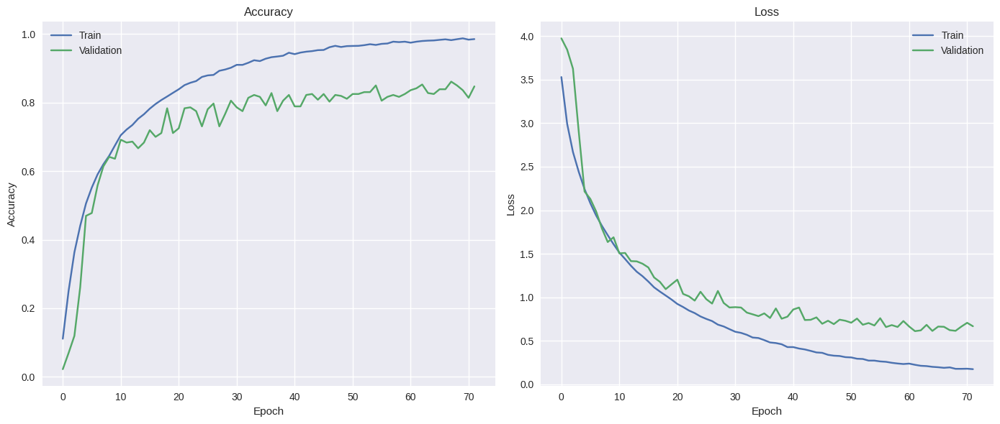

Best validation accuracy fold 0: 0.8611111044883728


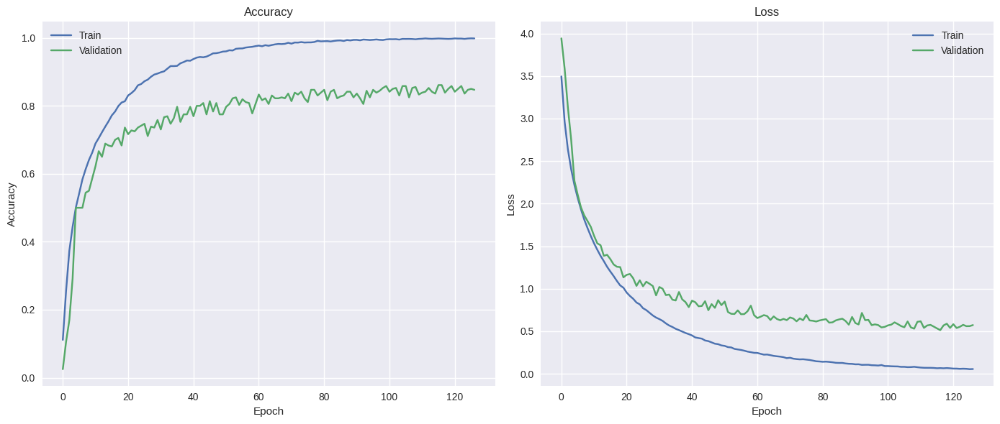

Best validation accuracy fold 1: 0.8611111044883728


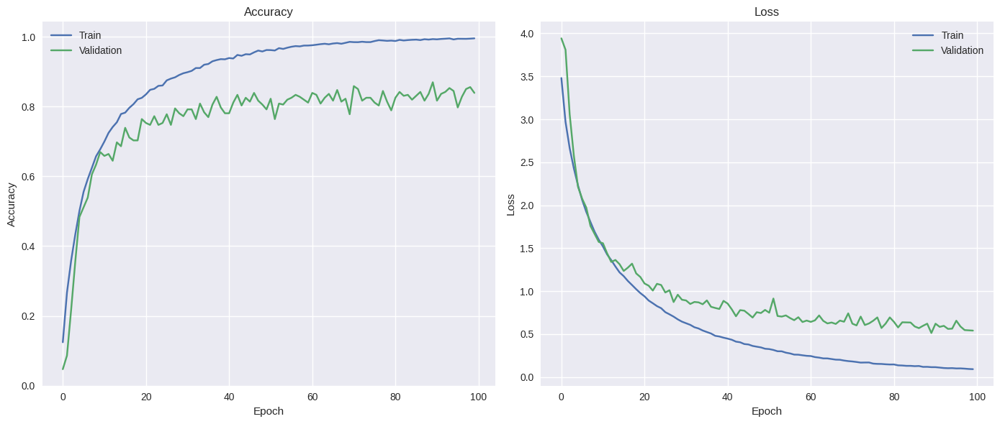

Best validation accuracy fold 2: 0.8694444298744202


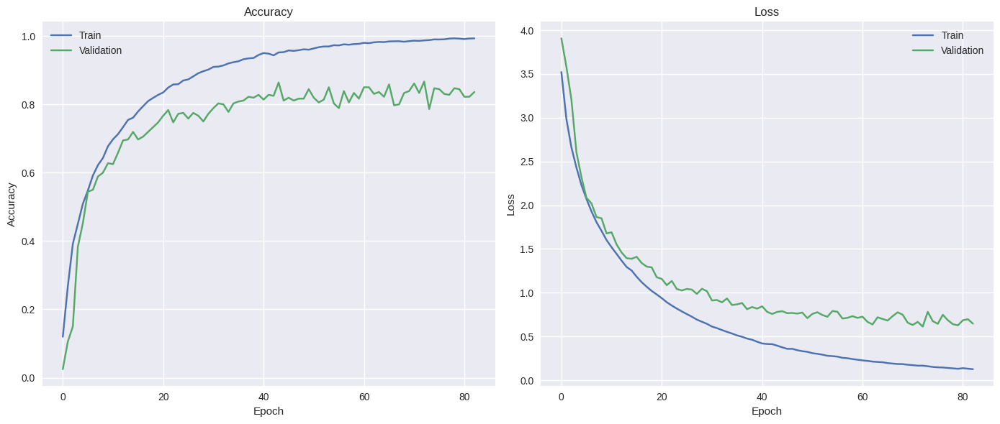

Best validation accuracy fold 3: 0.8666666746139526


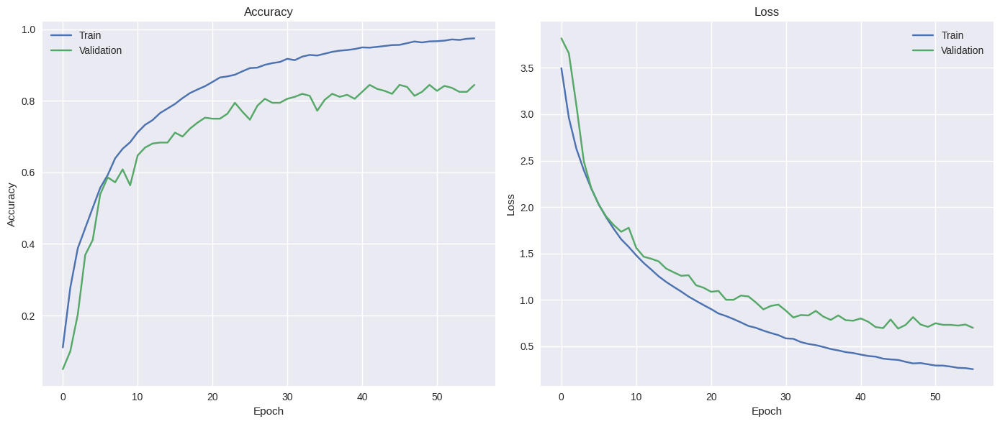

Best validation accuracy fold 4: 0.8444444537162781


In [31]:
for fold in range(n_splits):

  log_df = pd.read_csv(f'model_fold_{fold}.log')

  plt.figure(figsize=(14, 6))
  plt.subplot(1, 2, 1)
  plt.plot(log_df['epoch'], log_df['accuracy'], label='Train')
  plt.plot(log_df['epoch'], log_df['val_accuracy'], label='Validation')
  plt.title('Accuracy')
  plt.xlabel('Epoch')
  plt.ylabel('Accuracy')
  plt.legend()

  plt.subplot(1, 2, 2)
  plt.plot(log_df['epoch'], log_df['loss'], label='Train')
  plt.plot(log_df['epoch'], log_df['val_loss'], label='Validation')
  plt.title('Loss')
  plt.xlabel('Epoch')
  plt.ylabel('Loss')
  plt.legend()
  plt.tight_layout()
  plt.show()

  best_acc = log_df['val_accuracy'].max()
  print(f'Best validation accuracy fold {fold}:', best_acc)

In [43]:
test_acc_list = []

for fold in range(n_splits):
  model.load_weights(f'model_fold_{fold}.h5')
  [loss_test, acc_test] = model.evaluate(X_test_exp, y_test, verbose=0)
  print(f"Test loss fold {fold}: {loss_test}")
  print(f"Test accuracy {fold}: {acc_test}")
  test_acc_list.append(acc_test)

print(f"Average Test Accuracy (Stratified K-Fold): {np.mean(test_acc_list)}")

max_value = max(test_acc_list)
max_index = test_acc_list.index(max_value)
model.load_weights(f'model_fold_{max_index}.h5')  #now, model is the best model
X_val_exp = X_val_list[max_index]
y_val = y_val_list[max_index]

Test loss fold 0: 0.5819962620735168
Test accuracy 0: 0.8799999952316284
Test loss fold 1: 0.5906745791435242
Test accuracy 1: 0.8650000095367432
Test loss fold 2: 0.541269063949585
Test accuracy 2: 0.8799999952316284
Test loss fold 3: 0.6980184316635132
Test accuracy 3: 0.824999988079071
Test loss fold 4: 0.7549343705177307
Test accuracy 4: 0.8299999833106995
Average Test Accuracy (Stratified K-Fold): 0.8559999942779541


12/12 ━━━━━━━━━━━━━━━━━━━━ 3s 174ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


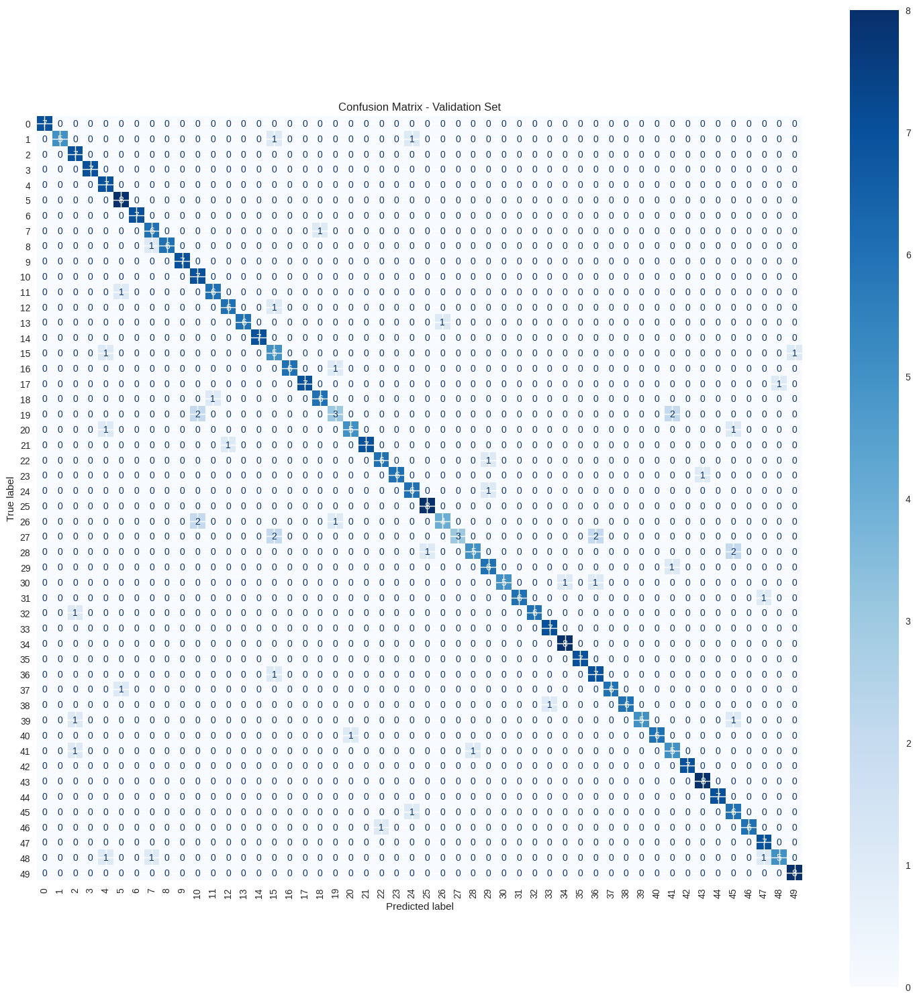

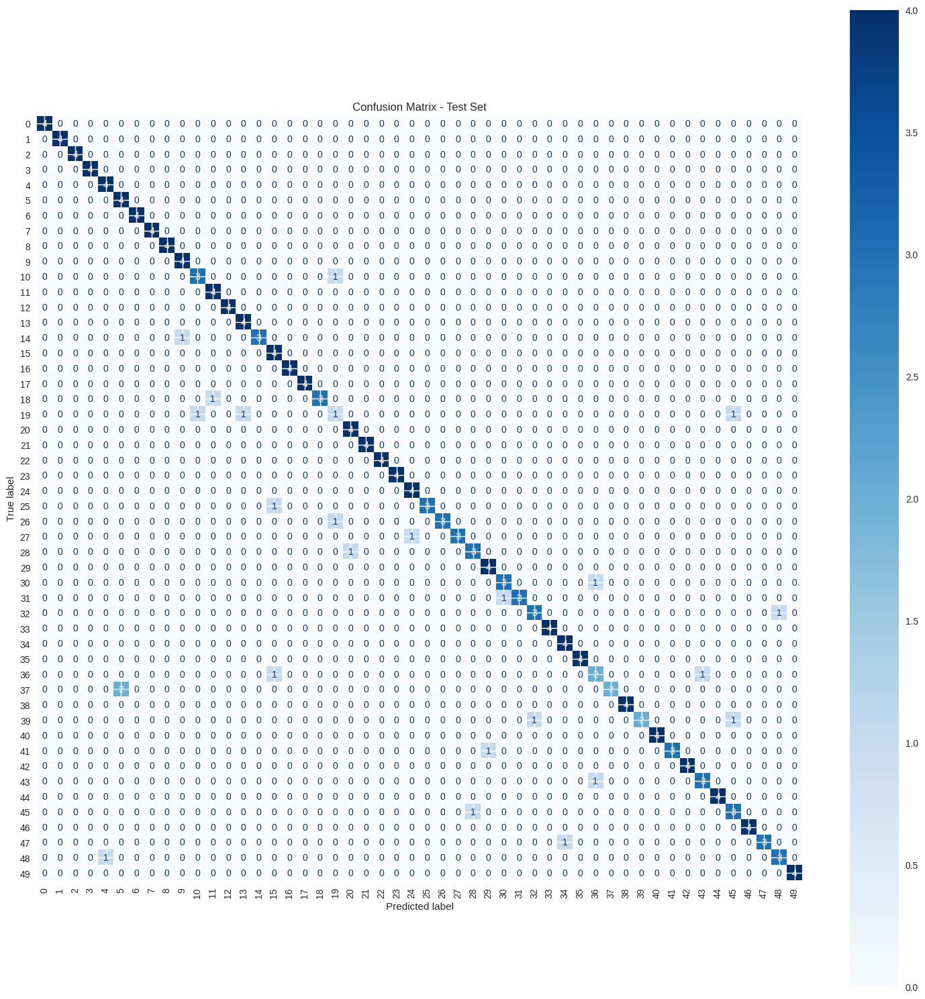

In [44]:
possible_classes = np.arange(0, 50)

pred_val = model.predict(X_val_exp)
pred_test = model.predict(X_test_exp)

pred_val_classes = np.argmax(pred_val, axis=1)
pred_test_classes = np.argmax(pred_test, axis=1)

# Confusion Matrix - Validation
cm_val = confusion_matrix(y_val, pred_val_classes)
fig_val, ax_val = plt.subplots(figsize=(15, 15))
disp_val = ConfusionMatrixDisplay(confusion_matrix=cm_val, display_labels=possible_classes)
disp_val.plot(cmap=plt.cm.Blues, ax=ax_val, xticks_rotation=90)
ax_val.set_title('Confusion Matrix - Validation Set')
plt.tight_layout()
plt.show()

print('')

# Confusion Matrix - Test
cm_test = confusion_matrix(y_test, pred_test_classes)
fig_test, ax_test = plt.subplots(figsize=(15, 15))
disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=possible_classes)
disp_test.plot(cmap=plt.cm.Blues, ax=ax_test, xticks_rotation=90)
ax_test.set_title('Confusion Matrix - Test Set')
plt.tight_layout()
plt.show()

In [45]:
print(classification_report(y_val, pred_val_classes, zero_division=0))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         7
           1       1.00      0.71      0.83         7
           2       0.70      1.00      0.82         7
           3       1.00      1.00      1.00         7
           4       0.70      1.00      0.82         7
           5       0.80      1.00      0.89         8
           6       1.00      1.00      1.00         7
           7       0.75      0.86      0.80         7
           8       1.00      0.86      0.92         7
           9       1.00      1.00      1.00         7
          10       0.64      1.00      0.78         7
          11       0.86      0.86      0.86         7
          12       0.86      0.86      0.86         7
          13       1.00      0.86      0.92         7
          14       1.00      1.00      1.00         7
          15       0.50      0.71      0.59         7
          16       1.00      0.86      0.92         7
          17       1.00    

In [46]:
print(classification_report(y_test, pred_test_classes, zero_division=0))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         4
           1       1.00      1.00      1.00         4
           2       1.00      1.00      1.00         4
           3       1.00      1.00      1.00         4
           4       0.80      1.00      0.89         4
           5       0.67      1.00      0.80         4
           6       1.00      1.00      1.00         4
           7       1.00      1.00      1.00         4
           8       1.00      1.00      1.00         4
           9       0.80      1.00      0.89         4
          10       0.75      0.75      0.75         4
          11       0.80      1.00      0.89         4
          12       1.00      1.00      1.00         4
          13       0.80      1.00      0.89         4
          14       1.00      0.75      0.86         4
          15       0.67      1.00      0.80         4
          16       1.00      1.00      1.00         4
          17       1.00    